## Approach

* This is a simplied version of YOLO. The input image is 512x512. YOLO was intended to train on images which all contained at least one object, most multiple objects. The architecture and loss functions have been adapted for this case, where not every image contains an object and there are at most 4 ROIs per image. 
* Since the maximum number of ROIs in each image is 4 we decided to use a 2x2 grid to simplify the network. In the case where multiple ROIs occur in the same cell we combine the ROIs into a single ROI by expanding the box to include both. Each cell outputs five values:
    * The confidence that there is pneumonia present
    * The x, y, w, and h of the bounding box
    * We have removed the entire classification section, using the confidence to indicate whether there is an ROI in the cell instead.
* A sigmoid is applied to the output of the network to result in values between 0 and 1    
* The x and y coordinates are offsets from the upper left corner of each cell, the w and h are percentage of the total width.
* The loss function is based on YOLO with some differences:
    * The weights of the components have been updated
    * The classification loss has been removed.
    * The "objectness" loss of YOLO tries to make the confidence match the actual IOU. Since our model only outputs one box per cell, this doesn't really make any sense and ends up driving the confidence down to the IOU. We replace this by an IOU loss which subtracts the IOU for that cell from 1.

## Network

* The network consists of a number of residual blocks with convolutions and downsampling blocks with max pooling.
* There are two dilated convolutions at the end of the network to provide context.
* The dilated convolutions are followed by two strided convolutions which downsize to 2x2.
* Finally there are a series of 1x1 convolutions which output a 2x2x5 tensor.
* We are using an Adam optimizer with gradient clipping to avoid exploding gradients, which had been a problem.

## Predictions
* To generate our predictions we loop through each cell of the output
* We unnormalize the output to get the actual values
* If the confidence is greater than 0.5 and the box has width and height we append it to the list of candidates.
* We apply non-max suppression to remove duplicates.
* The remaining boxes are concatenated onto the output string.

**Change Log:**
* v3 - changing output to 8x8 grid from 16x16; changed model to downsample one more time; adjusted network accordingly. 
* v4 - changed output to 4x4 grid, no image has more than 3 ROIs so this may work better? 
    * Using center point of ROI to predict instead of upper left corner.
* v5 - We only calculate MSE loss for boxes with a confidence over 0.5 or actual truth since we don't care about predictions for boxes that are not ROIs. This will prevent the network from being constrained by outputting 0s for boxes that don't exist.
* v6 - centering input data so maybe bboxes can be output more accurately? Also centering the image
* v6.2 - labels have ROI centered in center of cell by default instead of mean location.
* v8 - using custom loss function based on YOLO loss. Set default height and width to 1 px because 0 sent the gradients to -inf which screwed everything up.
* v10 - using 2x2 grid as output
* v12 - changing layout of model slightly - replaced final pools with convs with strides; reduced number of params; ensure that there is at least one positive image per batch.
* v13 - tweaking architecture slightly.
* v14 - going to 5x5 grid
* v15 - downsizing with average and max pool followed by 1x1 convolutions
* v15.2 - fixed an error where a layer of the network was being bypassed, removed some layers to prevent overfitting, training on labels with jittered ROIs
* v18 - separating fc branches for confidence and boxes, might work better?
* v19 - removing double pools and just using a simple max pool
* v20 - adding more layers to network, simplifying metrics and loss function
* v21 - trying 7x7 grid, removing one downsampling layer to keep input size reasonable
* v22 - some minor changes to network
* v23 - adding spatial dropout to prevent overfitting, other minor changes
* v24 - separating augmentation into discrete levels so we can slowly add it to speed up training, minor changes to network

In [0]:
# install dependencies not included by Colab
# use pip3 to ensure compatibility w/ Google Deep Learning Images 
!pip install -q pydicom 
!pip install -q imgaug 
!pip install -q kaggle
!pip install -q tqdm 

In [1]:
import os
import csv
import random
import pydicom
import numpy as np
import pickle
import pandas as pd
from skimage import measure
from skimage.transform import resize
from skimage.filters import gaussian
import datetime
import math

import tensorflow as tf
from tensorflow import keras

from matplotlib import pyplot as plt
import matplotlib.patches as patches

c:\users\eric\anaconda2\envs\hse_dl\lib\site-packages\h5py\__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [0]:
from google.colab import auth
from googleapiclient.http import MediaFileUpload
from googleapiclient.discovery import build

auth.authenticate_user()

drive_service = build('drive', 'v3')

def save_file_to_drive(name, path):
    file_metadata = {
      'name': name,
        'mimeType': 'application/octet-stream',
     }

    media = MediaFileUpload(path, 
                    mimetype='application/octet-stream',
                    resumable=True)

    created = drive_service.files().create(body=file_metadata,
                                   media_body=media,
                                   fields='id').execute()

    print('File ID: {}'.format(created.get('id')))

    return created

In [2]:
# Malisiewicz et al.
def non_max_suppression_fast(boxes, overlapThresh=0.3):
    # if there are no boxes, return an empty list
    if len(boxes) == 0:
        return []
 
    # if the bounding boxes integers, convert them to floats --
    # this is important since we'll be doing a bunch of divisions
    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")
 
    # initialize the list of picked indexes	
    pick = []
 
    # grab the coordinates of the bounding boxes
    x1 = boxes[:,0]
    y1 = boxes[:,1]
    w = boxes[:,2]
    h = boxes[:,3]
 
    x2 = x1 + w
    y2 = y1 + h

    # compute the area of the bounding boxes and sort the bounding
    # boxes by the bottom-right y-coordinate of the bounding box
    area = (w + 1) * (h + 1)
    idxs = np.argsort(y2)
 
    # keep looping while some indexes still remain in the indexes
    # list
    while len(idxs) > 0:
        # grab the last index in the indexes list and add the
        # index value to the list of picked indexes
        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)
 
        # find the largest (x, y) coordinates for the start of
        # the bounding box and the smallest (x, y) coordinates
        # for the end of the bounding box
        xx1 = np.maximum(x1[i], x1[idxs[:last]])
        yy1 = np.maximum(y1[i], y1[idxs[:last]])
        xx2 = np.minimum(x2[i], x2[idxs[:last]])
        yy2 = np.minimum(y2[i], y2[idxs[:last]])
 
        # compute the width and height of the bounding box
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
 
        # compute the ratio of overlap
        overlap = (w * h) / area[idxs[:last]]
 
        # delete all indexes from the index list that have
        idxs = np.delete(idxs, np.concatenate(([last],
            np.where(overlap > overlapThresh)[0])))
 
    # return only the bounding boxes that were picked using the
    # integer data type
    return boxes[pick]#.astype("int")

# get actual x and y values from sigmoid output and what cell they are in
def unnorm(val, idx, cell_size=256):
    x = (val * cell_size) + (cell_size * idx)
    return x

# sigmoid in numpy, with limit to avoid nans                             
def sigmoid(x):
    # to avoid NaNs set a lower floor on x values
    y = np.maximum(x, -700)
    y = np.minimum(y, 700)
    return 1 / (1 + np.exp(-y))    

# adjust contrast of image
def change_contrast(img, contrast_factor):
    mean = np.mean(img)
    img = (img - mean) * contrast_factor + mean
    return img

def get_intersect(box1, box2):
    # unpack each box
    x1, y1, w1, h1, c1 = box1
    x2, y2, w2, h2, x2 = box2
    
    # get the far corners
    x1_f = x1 + w1
    y1_f = y1 + h1
    x2_f = x2 + w2
    y2_f = y2 + h2
    
    # get corners of intersection
    x1_i = np.maximum(x1, x2)
    y1_i = np.maximum(y1, y2)
    x2_i = np.minimum(x1_f, x2_f)
    y2_i = np.minimum(y1_f, y2_f)
    
    w_i = x2_i - x1_i
    h_i = y2_i - y1_i
    
    w_i = np.maximum(w_i, 0)
    h_i = np.maximum(h_i, 0)

    intersect_area = w_i * h_i
    
    return intersect_area  
  
# helper function to calculate IoU
def calculate_iou(box1, box2):
    x11, y11, w1, h1 = box1[:4]
    x21, y21, w2, h2 = box2[:4]
    assert w1 * h1 > 0
    assert w2 * h2 > 0
    x12, y12 = x11 + w1, y11 + h1
    x22, y22 = x21 + w2, y21 + h2

    area1, area2 = w1 * h1, w2 * h2
    xi1, yi1, xi2, yi2 = max([x11, x21]), max([y11, y21]), min([x12, x22]), min([y12, y22])
    
    if xi2 <= xi1 or yi2 <= yi1:
        return 0
    else:
        intersect = (xi2-xi1) * (yi2-yi1)
        union = area1 + area2 - intersect
        return intersect / union  

# calculate IOU where there can be multiple overlapping truths and predictions
def calc_iou_better(y_true, y_pred):
    label_array = np.zeros((1024, 1024))
    
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    for truth in y_true:
        x,y,w,h = truth[:4].astype(int)  
        label_array[y:y+h, x:x+w] = 1
                
    pred_array = np.zeros((1024, 1024))
    for pred in y_pred:
        x,y,w,h = pred[:4].astype(int)

        # update the pixels
        pred_array[y:y+h, x:x+w] = 1
                
    true_area = np.sum(label_array)
    pred_area = np.sum(pred_array)
    
    intersect_area = np.sum((pred_array == 1) & (label_array == 1))
    
    union = true_area + pred_area - intersect_area
    
    iou = intersect_area / (union + 1e-6)
    
    return iou      
      
def map_iou(boxes_true, boxes_pred, scores, thresholds = [0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75]):
    """
    Mean average precision at differnet intersection over union (IoU) threshold
    
    input:
        boxes_true: Mx4 numpy array of ground true bounding boxes of one image. 
                    bbox format: (x1, y1, w, h)
        boxes_pred: Nx4 numpy array of predicted bounding boxes of one image. 
                    bbox format: (x1, y1, w, h)
        scores:     length N numpy array of scores associated with predicted bboxes
        thresholds: IoU shresholds to evaluate mean average precision on
    output: 
        map: mean average precision of the image
    """
    
    # According to the introduction, images with no ground truth bboxes will not be 
    # included in the map score unless there is a false positive detection (?)
        
    # return None if both are empty, don't count the image in final evaluation (?)
    if len(boxes_true) == 0 and len(boxes_pred) == 0:
        return None
    elif (len(boxes_true) == 0) and (len(boxes_pred) != 0):
        return 0
    
    assert boxes_true.shape[1] == 4 or boxes_pred.shape[1] == 4, "boxes should be 2D arrays with shape[1]=4"
    if len(boxes_pred):
        assert len(scores) == len(boxes_pred), "boxes_pred and scores should be same length"
        # sort boxes_pred by scores in decreasing order
        boxes_pred = boxes_pred[np.argsort(scores)[::-1], :]
    
    map_total = 0
    
    # loop over thresholds
    for t in thresholds:
        matched_bt = set()
        tp, fn = 0, 0
        for i, bt in enumerate(boxes_true):
            matched = False
            for j, bp in enumerate(boxes_pred):
                miou = calculate_iou(bt, bp)
                if miou >= t and not matched and j not in matched_bt:
                    matched = True
                    tp += 1 # bt is matched for the first time, count as TP
                    matched_bt.add(j)
            if not matched:
                fn += 1 # bt has no match, count as FN
                
        fp = len(boxes_pred) - len(matched_bt) # FP is the bp that not matched to any bt
        m = tp / (tp + fn + fp)
        map_total += m
    
    return map_total / len(thresholds)      

# given the label or predictions, return a list containing the actual coordinates
# for each box
def unnorm_label(label, threshold=0.5):
    grid_size = label.shape[0]
    cell_size = 1024 / grid_size
    
    boxes = []
    # loop through the cells of our label
    for i in range(grid_size):
        for j in range(grid_size):
            # if we have a box in a cell
            if label[i,j,0] > threshold:
                # unpack the data
                c, x, y, w, h = label[i, j]
                
                # unnormalize the data
                w, h = int(w*1024), int(h*1024)
                x = unnorm(x, j, cell_size)
                y = unnorm(y, i, cell_size)
                
                # get the corners
                x = int(x - (w / 2))
                y = int(y - (h / 2))
                
                # it's possible the corner is in another cell, if so catch the error
                x = np.maximum(x, 0)
                y = np.maximum(y, 0)
                    
#                 print(x, y, w, h, "box:", i, j)
                boxes.append([x, y, w, h, c])
    
    return boxes

In [3]:
# enter your Kaggle credentionals here
os.environ['KAGGLE_USERNAME']="skooch"
os.environ['KAGGLE_KEY']="42f8a02ee92cc773d1dbe66565673ad3"

In [ ]:
# If you are unable to download the competition dataset, check to see if you have 
# accepted the user agreement on the competition website. 
if not os.path.exists("./stage_1_detailed_class_info.csv.zip"):
    !kaggle competitions download -c rsna-pneumonia-detection-challenge

In [0]:
# unzipping takes a few minutes
if not os.path.exists("./stage_1_train_labels.csv"):
    print("Unzipping...")
    !unzip -q -o stage_1_test_images.zip -d stage_1_test_images
    !unzip -q -o stage_1_train_images.zip -d stage_1_train_images
    !unzip -q -o stage_1_train_labels.csv.zip

# Load pneumonia locations

Table contains [filename : pneumonia location] pairs per row. 
* If a filename contains multiple pneumonia, the table contains multiple rows with the same filename but different pneumonia locations. 
* If a filename contains no pneumonia it contains a single row with an empty pneumonia location.

The code below loads the table and transforms it into a dictionary. 
* The dictionary uses the filename as key and a list of pneumonia locations in that filename as value. 
* If a filename is not present in the dictionary it means that it contains no pneumonia.

In [4]:
ROOT_DIR = "./"

train_dicom_dir = os.path.join(ROOT_DIR, 'stage_1_train_images')
test_dicom_dir = os.path.join(ROOT_DIR, 'stage_1_test_images')
print("Train dir:", train_dicom_dir)

Train dir: ./stage_1_train_images


In [5]:
# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'pneumonia'

!gcloud config set project {project_id}
if not os.path.exists("./yolo_labels_centered_7x7_11b.p"):
    !gsutil cp gs://{bucket_name}/yolo_labels_centered_7x7_11b.p ./yolo_labels_centered_7x7_11b.p

Updated property [core/project].


In [6]:
with open('yolo_labels_centered_7x7_11b.p', 'rb') as handle:
    pneumonia_locations = pickle.load(handle)

# Load filenames

In [7]:
random.seed(724)

# load and shuffle filenames
folder = './stage_1_train_images'
filenames = os.listdir(folder)
random.shuffle(filenames)
# split into train and validation filenames
n_valid_samples = int(len(filenames) * 0.15)
train_filenames = filenames[n_valid_samples:]
valid_filenames = filenames[:n_valid_samples]
print('n train samples', len(train_filenames))
print('n valid samples', len(valid_filenames))
n_train_samples = len(filenames) - n_valid_samples

n train samples 451
n valid samples 79


In [8]:
positive_images = []

for filename in pneumonia_locations:
    label = pneumonia_locations[filename][...,0]
    if np.max(label) > 1e-6:
        if filename + ".dcm" in train_filenames:
            positive_images.append(filename + ".dcm")

 # Data generator

The dataset is too large to fit into memory, so we need to create a generator that loads data on the fly.

* The generator takes in some filenames, batch_size and other parameters.

* The generator outputs a random batch of numpy images and numpy masks.
    

In [9]:
BATCH_SIZE = 14
IMAGE_SIZE = 448
GRID_SIZE = 7
CELL_SIZE = 1024 / GRID_SIZE
CHECKPOINT_PATH = "yolo24_1_448.h5"

In [ ]:
!gsutil cp gs://{bucket_name}/{CHECKPOINT_PATH} ./{CHECKPOINT_PATH}

In [10]:
class generator(keras.utils.Sequence):
    
    def __init__(self, folder, filenames, pneumonia_locations=None, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, shuffle=True, augment=0, predict=False):
        self.folder = folder
        self.filenames = filenames
        self.pneumonia_locations = pneumonia_locations
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.augment = augment
        self.predict = predict
        self.on_epoch_end()
    
    def augment_imgs(self, img, confs, boxes):
        ## always do these augmentations
        # flip the image half the time
        if random.random() > 0.5:
            img = np.fliplr(img)
            
            # update our x coords
            mask = (confs != 0)
            
            # flip
            boxes[mask, 0] = (1 - boxes[mask,0])
            
            # flip our boxes lr on axis 0
            boxes = np.flip(boxes, axis=1)   
            
            # flip the confidences lr as well
            confs = np.flip(confs, axis=1)            
        
        # small shifts
        if random.random() > 0.5:  
            ## small random shifts
            h_offset = np.random.randint(low=0, high=8)
            v_offset = np.random.randint(low=0, high=8)

            # crop the images
            img = img[v_offset:,h_offset:]
        
        # level one augmentation
        if self.augment >= 1:
            # random crop or pad
            crop_or_pad = random.random()
            
            # crop
            if crop_or_pad > 0.66:
                # crop by max of 16 pixels
                h_offset_1 = np.random.randint(low=0, high=30)
                v_offset_1 = np.random.randint(low=0, high=30)

                h_offset_2 = 1024 - np.random.randint(low=0, high=30)
                v_offset_2 = 1024 - np.random.randint(low=0, high=30)

                # crop the images
                img = img[v_offset_1:v_offset_2,h_offset_1:h_offset_2]

                # update the labels - make sure they are positive
                boxes[...,0] = np.maximum((boxes[...,0] - (h_offset_1 / CELL_SIZE)), 0.001)
                boxes[...,1] = np.maximum((boxes[...,1] - (v_offset_1 / CELL_SIZE)), 0.001)

            # pad
            elif crop_or_pad > 0.33:
                h_offset_1 = np.random.randint(low=0, high=30)
                v_offset_1 = np.random.randint(low=0, high=30)

                h_offset_2 = np.random.randint(low=0, high=30)
                v_offset_2 = np.random.randint(low=0, high=30)

                img = np.pad(np.squeeze(img), ((v_offset_1, v_offset_2), (h_offset_1,h_offset_2)), mode="constant", constant_values=0)

                # adjust the labels
                right_shift = h_offset_2 - h_offset_1
                down_shift = v_offset_2 - v_offset_1

                boxes[...,0] = np.minimum((boxes[...,0] + (right_shift / CELL_SIZE)), 0.999)
                boxes[...,1] = np.minimum((boxes[...,1] + (down_shift / CELL_SIZE)), 0.999)
        
        # level two augmentation
        if self.augment >= 2:
            rand_ = random.random()
            # multiply
            if rand_ > 0.4:  
                factor = np.random.uniform(low=0.95, high=1.05)
                img = img * factor
            # adjust contrast  
            else:
                # generate a random contrast adjustment
                contrast_factor = np.random.normal(loc=1.0, scale=0.10)

                # put some limits on the contrast
                contrast_factor = np.minimum(contrast_factor, 1.25)
                contrast_factor = np.maximum(contrast_factor, 0.75)

                # adjust the image
                img = change_contrast(img, contrast_factor)
    
        # level 3 augmentation
        if self.augment >= 3:
            # gaussian blur
            if random.random() > 0.65:
                sigma = np.random.uniform(low=0, high=0.75)
                img = gaussian(img, sigma=sigma)
        
        if self.augment >= 4:
            # slight shape skew
            if random.random() > 0.75:
                x_scale = np.random.uniform(low=0.96, high=1.04, size=None)
                y_scale = np.random.uniform(low=0.96, high=1.04, size=None)

                # resize the image
                img = resize(img, (int(1024 * y_scale), int(1024 * x_scale)), mode='reflect')

                # resize the boxes
                boxes[...,2] = (boxes[...,2] * x_scale)
                boxes[...,3] = (boxes[...,3] * y_scale)
        
        return img, confs, boxes
            
            
    def __load__(self, filename):
        # load dicom file as numpy array
        img = pydicom.dcmread(os.path.join(self.folder, filename)).pixel_array
        # get filename without extension
        filename = filename.split('.')[0]
        label = pneumonia_locations[filename].copy()
        
        # remove the confidence and bboxes because they will be flipped separately
        # don't round the confidence as we are now using the unrounded values
        confs = label[:,:,0]
        boxes = label[:,:,1:]
        
        ## augment the data with flips, small shifts and contrast adjustment
        img, confs, boxes = self.augment_imgs(img, confs, boxes)
            
        # resize both image and mask
        img = resize(img, (self.image_size, self.image_size), mode='reflect')
        
        # scale and center the image
        img = (img - np.mean(img)) / np.max(img)
        
        boxes = np.concatenate([confs.reshape((GRID_SIZE,GRID_SIZE,1)), boxes], axis=2)
        
        # add trailing channel dimension
        img = np.expand_dims(img, -1)
        return img, boxes
    
    def __loadpredict__(self, filename):
        # load dicom file as numpy array
        img = pydicom.dcmread(os.path.join(self.folder, filename)).pixel_array
        # resize image
        img = resize(img, (self.image_size, self.image_size), mode='reflect')
        # add trailing channel dimension
        img = np.expand_dims(img, -1)
        return img
        
    def __getitem__(self, index):
        # select batch
        filenames = self.filenames[index*self.batch_size:(index+1)*self.batch_size]
        # predict mode: return images and filenames
        if self.predict:
            # load files
            imgs = [self.__loadpredict__(filename) for filename in filenames]
            # create numpy batch
            imgs = np.array(imgs)
            return imgs, filenames
        # train mode: return images and masks
        else:
            # load files
            items = [self.__load__(filename) for filename in filenames]
            
            # unzip images and masks
            imgs, bboxes = zip(*items)
            
            # create numpy batch
            imgs = np.array(imgs)
            bboxes = np.array(bboxes)
            
            # make sure there is at least one positive image in the batch
            pos = np.max(bboxes[:,:,:,0])
            if pos < 1:
                # pick a random positive image
                filename = np.random.choice(positive_images)
                img, label = self.__load__(filename)
                
                # add the positive image to our batch
                imgs[-1] = img
                bboxes[-1] = label
                
            labels = bboxes
            return imgs, labels
        
    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.filenames)
        
    def __len__(self):
        if self.predict:
            # return everything
            return int(np.ceil(len(self.filenames) / self.batch_size))
        else:
            # return full batches only
            return int(len(self.filenames) / self.batch_size)

In [37]:
filename = np.random.choice(filenames, 1)[0]

In [45]:
img = pydicom.dcmread(os.path.join("./stage_1_train_images", filename)).pixel_array

In [47]:
%%time
img = np.fliplr(img)

Wall time: 0 ns


In [48]:
%%time
# crop by max of 16 pixels
h_offset_1 = np.random.randint(low=0, high=30)
v_offset_1 = np.random.randint(low=0, high=30)

h_offset_2 = 1024 - np.random.randint(low=0, high=30)
v_offset_2 = 1024 - np.random.randint(low=0, high=30)

# crop the images
img = img[v_offset_1:v_offset_2,h_offset_1:h_offset_2]

h_offset_1 = np.random.randint(low=0, high=30)
v_offset_1 = np.random.randint(low=0, high=30)

h_offset_2 = np.random.randint(low=0, high=30)
v_offset_2 = np.random.randint(low=0, high=30)

img = np.pad(np.squeeze(img), ((v_offset_1, v_offset_2), (h_offset_1,h_offset_2)), mode="constant", constant_values=0)

Wall time: 3 ms


In [49]:
%%time
# adjust brightness or contrast
# if random.random() > 0.5:  
    # multiply image
#     if random.random() > 0.5:  
factor = np.random.uniform(low=0.85, high=1.15)
img = img * factor

Wall time: 7 ms


In [50]:
%%time
# generate a random contrast adjustment
contrast_factor = np.random.normal(loc=1.0, scale=0.10)

# put some limits on the contrast
contrast_factor = np.minimum(contrast_factor, 1.25)
contrast_factor = np.maximum(contrast_factor, 0.75)

# adjust the image
img = change_contrast(img, contrast_factor)

Wall time: 14 ms


In [51]:
%%time
## small random shifts
h_offset = np.random.randint(low=0, high=6)
v_offset = np.random.randint(low=0, high=6)

# crop the images
img = img[v_offset:,h_offset:]

Wall time: 0 ns


In [52]:
%%time
# slight shape skew            
x_scale = np.random.uniform(low=0.96, high=1.04, size=None)
y_scale = np.random.uniform(low=0.96, high=1.04, size=None)

# # resize the image
img = resize(img, (int(1024 * y_scale), int(1024 * x_scale)), mode='reflect')

Wall time: 77 ms


C:\Users\eric\AppData\Roaming\Python\Python36\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


In [53]:
%%time

sigma = np.random.uniform(low=0, high=0.75)
img = gaussian(img, sigma=sigma)

Wall time: 30 ms


### Double Check Image Augmentation

In [54]:
sample_images = np.random.choice(positive_images, 3)

In [69]:
%%time

train_gen = generator(folder, sample_images, pneumonia_locations, batch_size=3, image_size=1024, shuffle=True, augment=0, predict=False)

counter = 0
for imgs, labels in train_gen:
    for img, label in zip(imgs, labels):
#         f, ax = plt.subplots(figsize=(6, 6))
        
        # display the image
#         plt.imshow(np.squeeze(img))
        
        # show the labels
        rois = unnorm_label(label)
        
        for roi in rois:
            x, y, w, h, _ = roi
            
#             rect = patches.Rectangle((x,y), w, h, linewidth=1, edgecolor='r', facecolor='none')
#             ax.add_patch(rect)
        
#         plt.show()
    
    counter += 1
    if counter > 5:
        break

C:\Users\eric\AppData\Roaming\Python\Python36\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


Wall time: 2.29 s


In [70]:
%%time
train_gen = generator(folder, sample_images, pneumonia_locations, batch_size=3, image_size=1024, shuffle=True, augment=1, predict=False)

counter = 0
for imgs, labels in train_gen:
    for img, label in zip(imgs, labels):
#         f, ax = plt.subplots(figsize=(6, 6))
        
#         # display the image
#         plt.imshow(np.squeeze(img))
        
        # show the labels
        rois = unnorm_label(label)
        
        for roi in rois:
            x, y, w, h, _ = roi
            
#             rect = patches.Rectangle((x,y), w, h, linewidth=1, edgecolor='r', facecolor='none')
#             ax.add_patch(rect)
        
#         plt.show()
    
    counter += 1
    if counter > 5:
        break

C:\Users\eric\AppData\Roaming\Python\Python36\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


Wall time: 2.27 s


C:\Users\eric\AppData\Roaming\Python\Python36\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


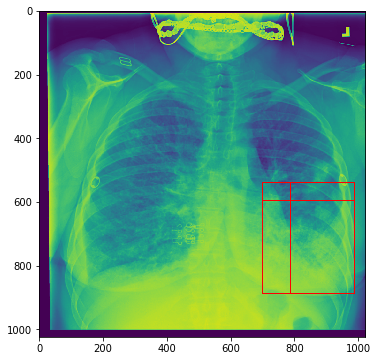

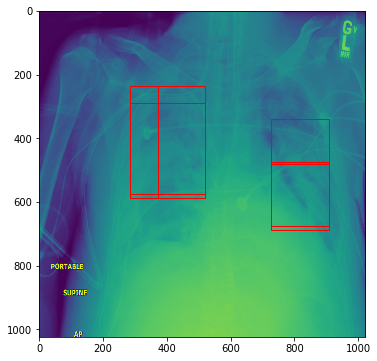

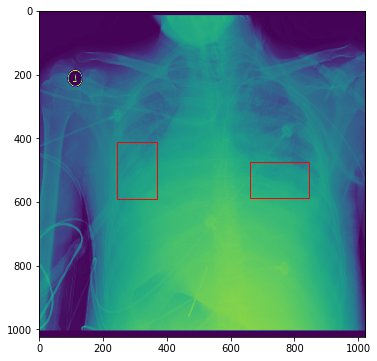

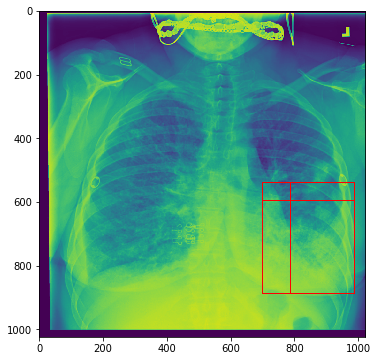

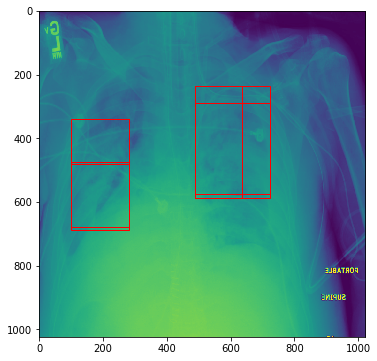

...

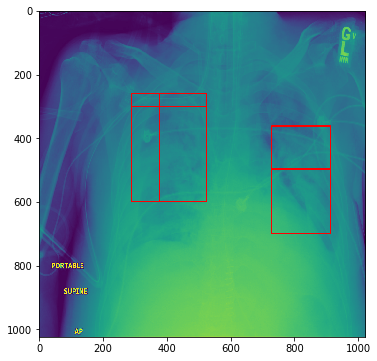

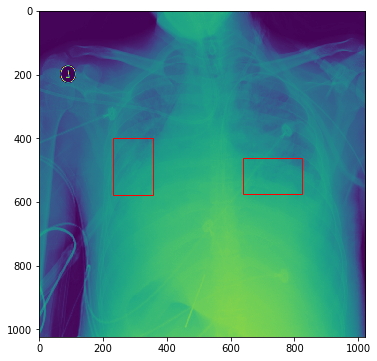

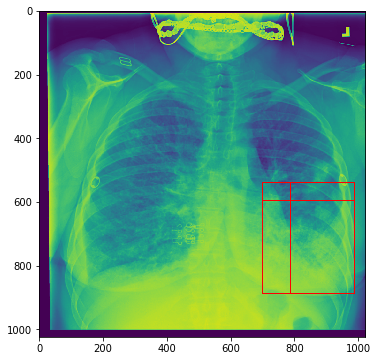

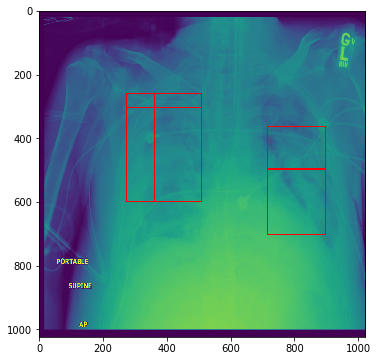

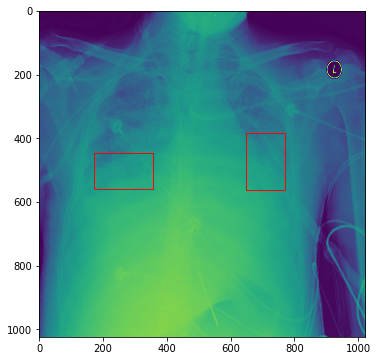

Wall time: 9.96 s


In [66]:
%%time

train_gen = generator(folder, sample_images, pneumonia_locations, batch_size=3, image_size=1024, shuffle=True, augment=2, predict=False)
counter = 0
for imgs, labels in train_gen:
    for img, label in zip(imgs, labels):
#         f, ax = plt.subplots(figsize=(6, 6))
        
#         # display the image
#         plt.imshow(np.squeeze(img))
        
        # show the labels
        rois = unnorm_label(label)
        
        for roi in rois:
            x, y, w, h, _ = roi
            
            rect = patches.Rectangle((x,y), w, h, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
        
        plt.show()
    
    counter += 1
    if counter > 5:
        break

In [60]:
train_gen = generator(folder, sample_images, pneumonia_locations, batch_size=3, image_size=1024, shuffle=True, augment=3, predict=False)

C:\Users\eric\AppData\Roaming\Python\Python36\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


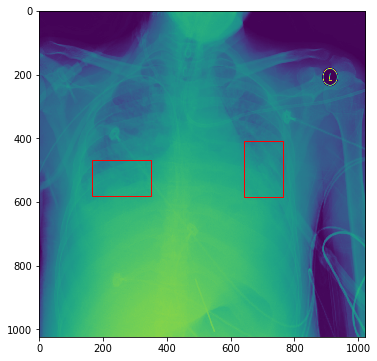

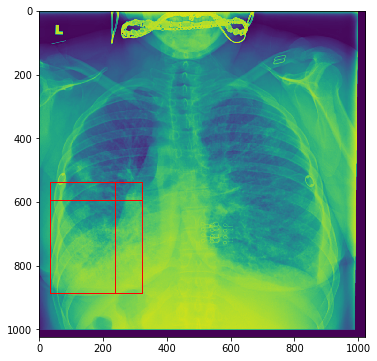

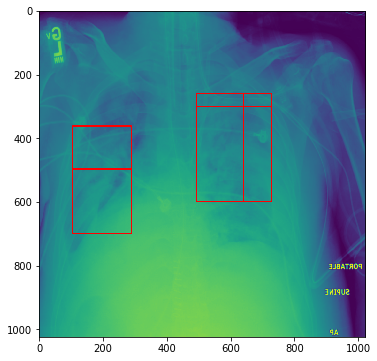

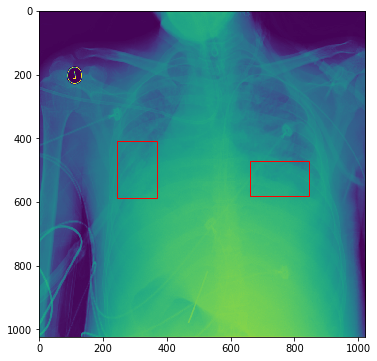

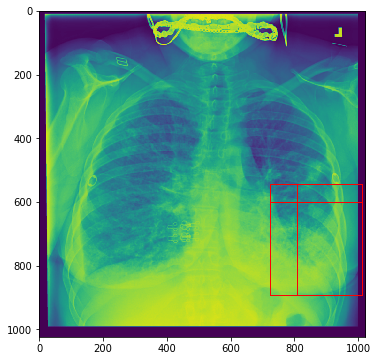

...

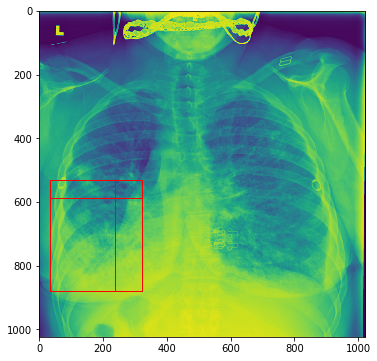

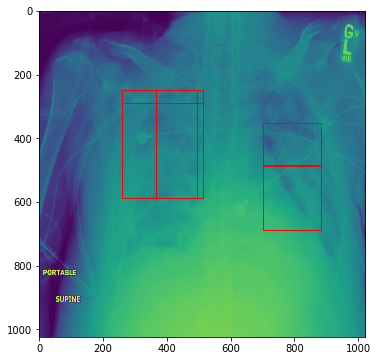

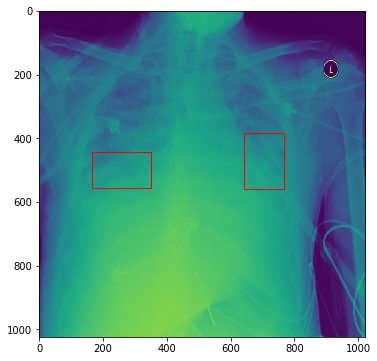

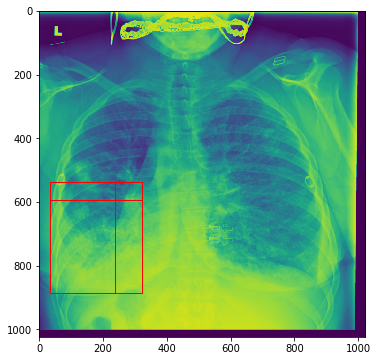

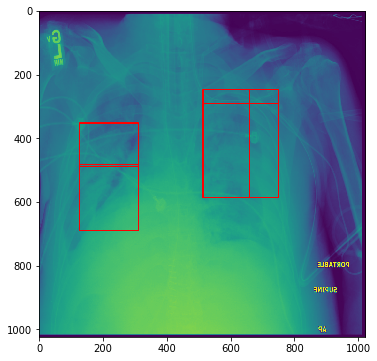

Wall time: 10.2 s


In [61]:
%%time
counter = 0
for imgs, labels in train_gen:
    for img, label in zip(imgs, labels):
        f, ax = plt.subplots(figsize=(6, 6))
        
        # display the image
        plt.imshow(np.squeeze(img))
        
        # show the labels
        rois = unnorm_label(label)
        
        for roi in rois:
            x, y, w, h, _ = roi
            
            rect = patches.Rectangle((x,y), w, h, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
        
        plt.show()
    
    counter += 1
    if counter > 5:
        break

C:\Users\eric\AppData\Roaming\Python\Python36\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


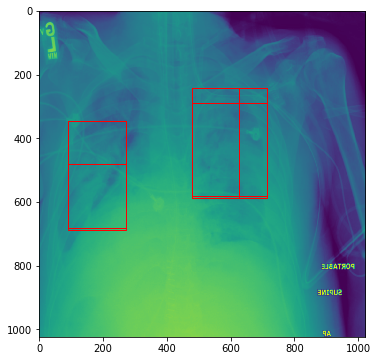

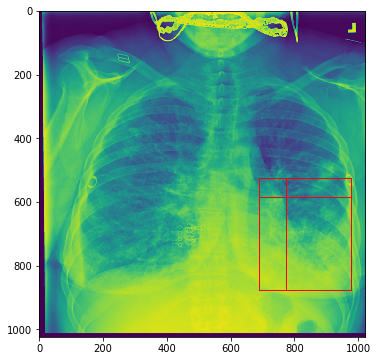

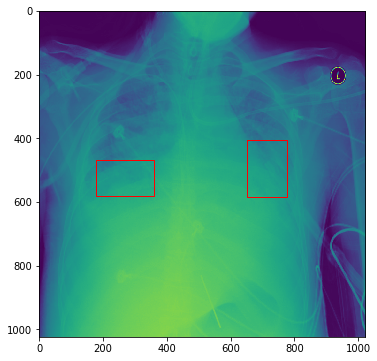

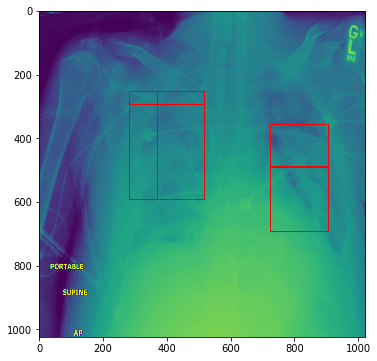

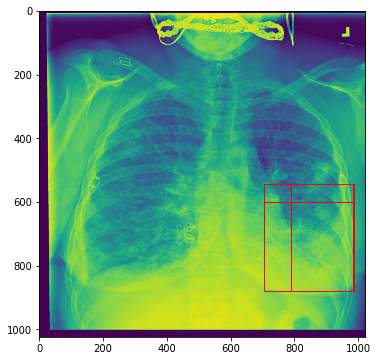

...

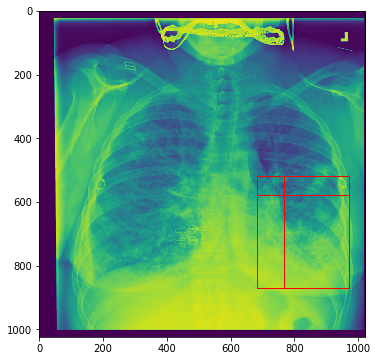

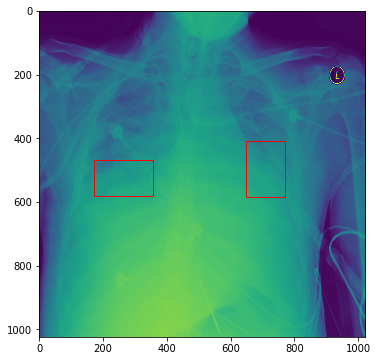

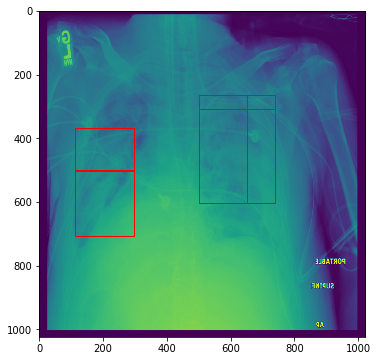

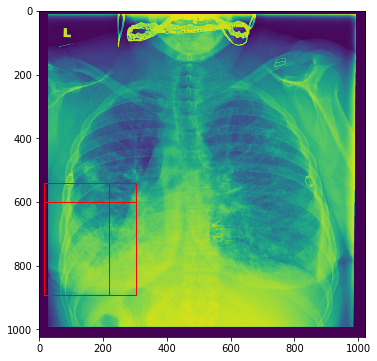

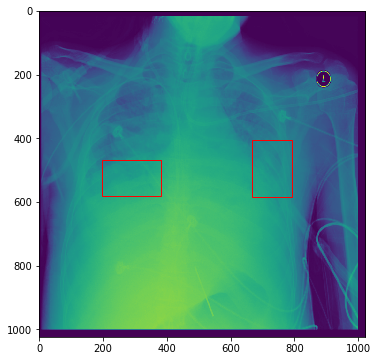

Wall time: 9.67 s


In [67]:
%%time
train_gen = generator(folder, sample_images, pneumonia_locations, batch_size=3, image_size=1024, shuffle=True, augment=4, predict=False)
counter = 0
for imgs, labels in train_gen:
    for img, label in zip(imgs, labels):
        f, ax = plt.subplots(figsize=(6, 6))
        
        # display the image
        plt.imshow(np.squeeze(img))
        
        # show the labels
        rois = unnorm_label(label)
        
        for roi in rois:
            x, y, w, h, _ = roi
            
            rect = patches.Rectangle((x,y), w, h, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
        
        plt.show()
    
    counter += 1
    if counter > 5:
        break

# Network

In [0]:
def create_downsample(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0.1)(x)
    x = keras.layers.MaxPool2D(2)(x)
    return x

def create_resblock(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0.1)(x)
    
    x_1 = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x_1)
    x = keras.layers.LeakyReLU(0.1)(x)
    
    x_2 = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x_2)
    x = keras.layers.LeakyReLU(0.1)(x)
    
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0.1)(x)
    
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.add([x, x_1])
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0.1)(x)
    
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.add([x, x_2])
    return x

def create_network(input_size, channels, n_blocks=2, depth=4):
    # input - 448x448x3
    inputs = keras.Input(shape=(input_size, input_size, 1))
    
    # downsample to 224x224x24
    x_1 = keras.layers.Conv2D(channels, 3, strides=(2,2), padding='same', use_bias=False)(inputs)
    x = keras.layers.BatchNormalization(momentum=0.9)(x_1)
    x = keras.layers.LeakyReLU(0.1)(x)
    
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0.1)(x)
    
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0.1)(x)
    
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.add([x, x_1])
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0.1)(x)
    
    # residual blocks
    for d in range(depth):
        
        x = create_downsample(channels, x)
        channels = channels * 2
        
        for b in range(n_blocks):
            x = create_resblock(channels, x)
    
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.SpatialDropout2D(0.10)(x)
    
    # dilated conv for context - 14x14x512
    x = keras.layers.Conv2D(512, (3,3), padding='same', dilation_rate=(2,2), activation=None, name="dilated_conv_1")(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0.1)(x)
    x = keras.layers.SpatialDropout2D(0.10)(x)
   
    x = keras.layers.Conv2D(512, (3,3), padding='same', activation=None, name="last_conv_1")(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0.1)(x)
    x = keras.layers.SpatialDropout2D(0.15)(x)

    # downsample to 7x7 with stride 2
    x = keras.layers.Conv2D(768, (3,3), padding='same', strides=(2,2), activation=None, name="downsample_1", kernel_regularizer=keras.regularizers.l2(l=0.002))(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0.1)(x)
    x = keras.layers.SpatialDropout2D(0.20)(x)
    
    # confidence output branch
    c = keras.layers.Conv2D(1024, (1,1), padding='same', activation=None, name="fc_1_c", kernel_regularizer=keras.regularizers.l2(l=0.01))(x)
    c = keras.layers.BatchNormalization(momentum=0.9)(c)
    c = keras.layers.LeakyReLU(0.01)(c)
    c = keras.layers.Dropout(0.25)(c)
    
    c = keras.layers.Conv2D(512, (1,1), padding='same', activation=None, name="fc_2_c", kernel_regularizer=keras.regularizers.l2(l=0.01))(c)
    c = keras.layers.BatchNormalization(momentum=0.9)(c)
    c = keras.layers.LeakyReLU(0.01)(c)
    c = keras.layers.Dropout(0.10)(c)
    
    confidence = keras.layers.Conv2D(1, (1,1), padding='same', activation="sigmoid", name="confidence_output")(c)
    
    # bounding box branch
    b = keras.layers.Conv2D(1568, (1,1), padding='same', activation=None, name="fc_1_b", kernel_regularizer=keras.regularizers.l2(l=0.01))(x)
    b = keras.layers.BatchNormalization(momentum=0.9)(b)
    b = keras.layers.LeakyReLU(0.01)(b)
    b = keras.layers.Dropout(0.25)(b)
    
    b = keras.layers.Conv2D(1024, (1,1), padding='same', activation=None, name="fc_2_b", kernel_regularizer=keras.regularizers.l2(l=0.01))(b)
    b = keras.layers.BatchNormalization(momentum=0.9)(b)
    b = keras.layers.LeakyReLU(0.01)(b)
    b = keras.layers.Dropout(0.10)(b)
    
    boxes = keras.layers.Conv2D(4, (1,1), padding='same', activation="sigmoid")(b)
    output = keras.layers.concatenate([confidence, boxes], name="bboxes_output")
    
    # return both outputs
    model = keras.Model(inputs=inputs, outputs=output)
    
    return model

# Train network


In [0]:
## callbacks
class Calc_IOU_CB(keras.callbacks.Callback):
    
    def on_epoch_end(self, epoch, logs={}):
        # only do this every other epoch as it is slow on a CPU
        if epoch % 3 == 0:
            valid_gen2 = generator(train_dicom_dir, valid_filenames, pneumonia_locations, batch_size=32, image_size=IMAGE_SIZE, shuffle=True, predict=False)
            ious = []
            tps = 0
            fps = 0
            fns = 0

            counter = 0
            for imgs, labels in valid_gen2:
                preds = model.predict(imgs)

                for pred, label in zip(preds, labels):
                    yhat = unnorm_label(pred)
                    y_true = unnorm_label(label)

                    if len(yhat) or len(y_true):
                        iou = calc_iou_better(y_true, yhat)
                        ious.append(iou)

                # calculate the precision and recall
                tp, fp, fn = calc_tps(labels, preds)

                tps += tp
                fps += fp
                fns += fn

                counter += 32

                # only evaluate half of val set each epoch to speed up training
                if counter > len(valid_filenames) / 6:
                    break

            prec = tps / (tps + fps)
            recall = tps / (tps + fns)
            f1_score = 2 * (prec * recall) / (prec + recall)
            print("Epoch", epoch+1, ": Mean IOU:", np.mean(ious), "Precision:", prec, "Recall:", recall, "F1:", f1_score)
        
        return

class UploadCheckpointCB(keras.callbacks.Callback):
    
    def on_epoch_end(self, epoch, logs={}):      
        if epoch % 2 == 0:
            !gsutil cp ./{CHECKPOINT_PATH} gs://{bucket_name}/

        return
    
# count the true pos, false pos and false negatives so we can calculate precision and recall
def calc_tps(y_true, y_pred):
    true_confs = np.round(y_true[...,0])
    pred_confs = np.round(y_pred[...,0])
    
    tps = np.sum((pred_confs == 1) & (true_confs == 1))
    fps = np.sum((pred_confs == 1) & (true_confs != 1))
    fns = np.sum((pred_confs != 1) & (true_confs == 1))
    
    return tps, fps, fns      

# exponential learning rate decay
def exp_decay(x):
    lr0 = 0.01
    epochs_drop = 10
    drop = 0.75
    lrate = lr0 * math.pow(drop, math.floor((1+x)/epochs_drop))
    return lrate


checkpoint = keras.callbacks.ModelCheckpoint(CHECKPOINT_PATH, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=True, mode='auto', period=1)
learning_rate = tf.keras.callbacks.LearningRateScheduler(exp_decay)
catch_nan = tf.keras.callbacks.TerminateOnNaN()  
upload_checkpoint = UploadCheckpointCB()  
calc_iou = Calc_IOU_CB()

In [0]:
## LOSS FUNCTIONS AND METRICS
GRID_SIZE = 7
CELL_SIZE = 1024 / GRID_SIZE

# calculate f1 score with smoothing to avoid NaNs
def f1_score(y_true, y_pred):
    # apply sigmoid and round our labels
    y_pred = tf.round(y_pred[...,0])
    y_true = tf.round(y_true[...,0])

    # true positives are both pred and truth == 1
    tps = tf.reduce_sum(y_pred * y_true) + 1
    # false positives are truth == 0 and pred == 1
    not_y_true = tf.cast(tf.equal(y_true, 0), dtype=tf.float32)
    fps = tf.reduce_sum(y_pred * not_y_true)
    # false negatives is truth == 1 and pred == 0
    not_y_pred = tf.cast(tf.equal(y_pred, 0), dtype=tf.float32)
    fns = tf.reduce_sum(y_true * not_y_pred)

    precision = tps / (tps + fps)
    recall = tps / (tps + fns)

    f1_score = 2 * (precision * recall) / (precision + recall)

    return f1_score

def binary_accuracy(y_true, y_pred):
    # apply sigmoid to our predictions and round to 0 or 1
    y_pred = tf.round(y_pred)
    y_true = tf.round(y_true)
    
    acc = tf.reduce_mean(tf.cast(tf.equal(y_true[...,0], y_pred[...,0]), dtype=tf.float32))
    return acc

def overlap_iou(y_true, y_pred):
    """
    Args:
        bboxes1: shape (batch_size, 16, 16, 4)
            with x1, y1, x2, y2 point order.
        bboxes2: shape (batch_size, 16, 16, 4)
            with x1, y1, x2, y2 point order.
        p1 *-----
           |     |
           |_____* p2
    Returns:
        Tensor with shape (total_bboxes1, total_bboxes2)
        with the IoU (intersection over union) of bboxes1[i] and bboxes2[j]
        in [i, j].
    """
    
    # flatten the data because it's easier that way
    bboxes1 = tf.reshape(y_true, (-1, 5))
    bboxes2 = tf.reshape(y_pred, (-1, 5))
    
    # split the components out
    true_boxes, x11, y11, w1, h1 = tf.split(bboxes1, 5, axis=1)
    pred_conf, x21, y21, w2, h2 = tf.split(bboxes2, 5, axis=1)
    
    # make sure the truth is an int
    true_boxes = tf.round(true_boxes)
    
    # convert the sigmoid output to center coordinates
    # add some to avoid negative numbers
    x11 = (x11 * CELL_SIZE) + 512
    x21 = (x21 * CELL_SIZE) + 512
    y11 = (y11 * CELL_SIZE) + 512
    y21 = (y21 * CELL_SIZE) + 512
    
    # get the actual height and width numbers
    w1 = w1 * 1024
    w2 = w2 * 1024
    h1 = h1 * 1024
    h2 = h2 * 1024
    
    # only count the cell is there is actually an ROI here or if one is predicted
    mask = (pred_conf >= 0.5) | (tf.round(true_boxes) == 1)
    
    # get the far corners of the boxes
    x12 = x11 + (w1 / 2)
    y12 = y11 + (h1 / 2)
    x22 = x21 + (w2 / 2)
    y22 = y21 + (h2 / 2)
    
    x11 = x11 - (w1 / 2)
    y11 = y11 - (h1 / 2)
    x21 = x21 - (w2 / 2)
    y21 = y21 - (h2 / 2)

    # find the corners of the intersection area
    xI1 = tf.maximum(x11, x21)
    yI1 = tf.maximum(y11, y21)

    xI2 = tf.minimum(x12, x22)
    yI2 = tf.minimum(y12, y22)
    
    # get the intersection area, if the truth has no boxes it is 0
    inter_area = true_boxes * (xI2 - xI1) * (yI2 - yI1)

    # get the area of each box
    bboxes1_area = (w1) * (h1)
    bboxes2_area = (w2) * (h2)
    
    # union is area of both boxes - intersection
    union = (bboxes1_area + bboxes2_area) - inter_area
    
    iou = tf.maximum(inter_area/(union + 1e-6), 0)
    
    # apply the mask
    iou = iou * tf.cast(mask, dtype=tf.float32)
    
    # reduce the mean so we have mean iou for our inputs
    return tf.reduce_mean(iou)
                    
def loss_fn(y_true, y_pred):
    # get the iou loss
    iou_loss = iou_loss_fn(y_true, y_pred)
    
    # get the xe loss
    xe_loss = binary_cross_entropy(y_true, y_pred)
    
    # get the box loss
    box_loss = adj_mse(y_true, y_pred)
    
    # add the losses and return them
    return (1.0 * xe_loss) + (box_loss * 2.0) + (iou_loss * 0.5)

def adj_mse(y_true, y_pred):    
    # square the error
    square_error = tf.square(y_true[...,1:] - y_pred[...,1:])
    sse = tf.reduce_sum(square_error, axis=[3])
    
    # apply the mask so we only count the loss from cells with actual ROIs
    mask = y_true[...,0]
    
    sse = tf.multiply(sse, mask)
    
    loss = tf.reduce_sum(sse)            
            
    return loss  
  
# use weight of 0.5 for negative cells, 19 for positive ones
def binary_cross_entropy(y_true, y_pred):
    conf_true = tf.round(y_true[...,0])
    conf_pred = y_pred[...,0]
    
    weight = 6.5
    weights = tf.multiply(conf_true, weight) + 0.5
    
    xe = tf.multiply(tf.square(conf_true - conf_pred), weights)
    
    return tf.reduce_sum(xe)

def objectness_loss_fn(y_true, y_pred):
    
    # pred box conf
    pred_box_conf = y_pred[...,0]
    
    # separate the x, y from the w, h
    true_box_xy = y_true[...,1:3] * CELL_SIZE
    true_box_wh = y_true[...,3:] * 1024
    
    pred_box_xy = y_pred[...,1:3] * CELL_SIZE
    pred_box_wh = y_pred[...,3:] * 1024
    
    # get the corners of the boxes by subtracting or adding half of h, w
    true_wh_half = true_box_wh / 2.
    true_mins    = true_box_xy - true_wh_half
    true_maxes   = true_box_xy + true_wh_half
    
    pred_wh_half = pred_box_wh / 2.
    pred_mins    = pred_box_xy - pred_wh_half
    pred_maxes   = pred_box_xy + pred_wh_half  
    
    # get the corners of the intersect area
    intersect_mins  = tf.maximum(pred_mins,  true_mins)
    intersect_maxes = tf.minimum(pred_maxes, true_maxes)
    intersect_wh    = tf.maximum(intersect_maxes - intersect_mins, 0.)
    intersect_areas = intersect_wh[..., 0] * intersect_wh[..., 1]
    
    true_areas = true_box_wh[..., 0] * true_box_wh[..., 1]
    pred_areas = pred_box_wh[..., 0] * pred_box_wh[..., 1]

    union_areas = pred_areas + true_areas - intersect_areas
    iou_scores  = tf.truediv(intersect_areas, union_areas + 1e-16)
    
    true_box_conf = iou_scores * y_true[..., 0]
    
    conf_mask  = tf.zeros_like(iou_scores)
    conf_mask = conf_mask + tf.cast((iou_scores < 0.6), dtype=tf.float32) * (1 - y_true[...,0])
    conf_mask = conf_mask + y_true[..., 0] * 5.0
    
    nb_conf_box  = tf.reduce_sum(tf.cast((conf_mask > 0.0), dtype=tf.float32)) 
    
    loss_conf  =  tf.reduce_sum(tf.square(true_box_conf-pred_box_conf) * conf_mask)  / (nb_conf_box + 1e-6) / 2.
    
    return tf.reduce_sum(loss_conf)

def iou_loss_fn(y_true, y_pred):
    
    # separate the x, y from the w, h and unnormalize them
    true_box_xy = y_true[...,1:3] * CELL_SIZE
    true_box_wh = y_true[...,3:] * 1024
    
    pred_box_xy = y_pred[...,1:3] * CELL_SIZE
    pred_box_wh = y_pred[...,3:] * 1024
    
    # get the corners of the boxes by subtracting or adding half of h, w
    true_wh_half = true_box_wh / 2.
    true_mins    = true_box_xy - true_wh_half
    true_maxes   = true_box_xy + true_wh_half
    
    pred_wh_half = pred_box_wh / 2.
    pred_mins    = pred_box_xy - pred_wh_half
    pred_maxes   = pred_box_xy + pred_wh_half  
    
    # get the corners of the intersect area
    intersect_mins  = tf.maximum(pred_mins,  true_mins)
    intersect_maxes = tf.minimum(pred_maxes, true_maxes)
    intersect_wh    = tf.maximum(intersect_maxes - intersect_mins, 0.)
    intersect_areas = intersect_wh[..., 0] * intersect_wh[..., 1]
    
    # get the area of the boxes
    true_areas = true_box_wh[..., 0] * true_box_wh[..., 1]
    pred_areas = pred_box_wh[..., 0] * pred_box_wh[..., 1]

    # calculate the IOU
    union_areas = pred_areas + true_areas - intersect_areas
    # multiple the IOU by the confidence so we have a more useful loss function
    iou_scores  = tf.truediv(intersect_areas, union_areas + 1e-16) * y_pred[...,0]
    
    # only use the IOU from boxes which actually have ROIs
    mask = y_true[...,0]
    
    # subtract IOU from 1 and apply the mask
    use_iou = (1 - iou_scores)
    use_iou = tf.multiply(use_iou, mask)
    
    return tf.reduce_sum(use_iou)

In [24]:
model = create_network(input_size=IMAGE_SIZE, channels=32, n_blocks=1, depth=4)

optimizer = keras.optimizers.Adam(lr=0.008, beta_1=0.9, beta_2=0.999, decay=0.0, clipnorm=1.0, clipvalue=0.5)

model.compile(optimizer=optimizer,
              loss=loss_fn,
              metrics=[binary_accuracy, adj_mse, binary_cross_entropy, iou_loss_fn, f1_score])

model.load_weights(CHECKPOINT_PATH)

use_tpu = False
# if we are using the tpu copy the keras model to a new var and assign the tpu model to model
if use_tpu:
    TPU_WORKER = 'grpc://' + os.environ['COLAB_TPU_ADDR']
    original_model = model
    
    # create network and compiler
    model = tf.contrib.tpu.keras_to_tpu_model(
        original_model, strategy = tf.contrib.tpu.TPUDistributionStrategy(
            tf.contrib.cluster_resolver.TPUClusterResolver(TPU_WORKER)))
    
    BATCH_SIZE = BATCH_SIZE * 8
    
# create train and validation generators
folder = './stage_1_train_images'

# generators add augmentation with 1 having none and 4 having full augmentation. 
# generator 5 trains on all files, not separating out validation set to be used for final epochs
train_gen_1 = generator(folder, train_filenames, pneumonia_locations, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, shuffle=True, augment=0, predict=False)
train_gen_2 = generator(folder, train_filenames, pneumonia_locations, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, shuffle=True, augment=1, predict=False)
train_gen_3 = generator(folder, train_filenames, pneumonia_locations, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, shuffle=True, augment=2, predict=False)
train_gen_4 = generator(folder, train_filenames, pneumonia_locations, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, shuffle=True, augment=3, predict=False)
train_gen_5 = generator(folder, filenames, pneumonia_locations, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, shuffle=True, augment=3, predict=False)
train_gen = generator(folder, train_filenames, pneumonia_locations, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, shuffle=True, augment=True, predict=False)

valid_gen = generator(folder, valid_filenames, pneumonia_locations, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, shuffle=False, predict=False)

print(model.summary())

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 448, 448, 1)  0                                            
__________________________________________________________________________________________________
conv2d_25 (Conv2D)              (None, 224, 224, 32) 288         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_36 (BatchNo (None, 224, 224, 32) 128         conv2d_25[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_36 (LeakyReLU)      (None, 224, 224, 32) 0           batch_normalization_36[0][0]     
__________________________________________________________________________________________________
conv2d_26 

In [24]:
history = model.fit_generator(train_gen_1, validation_data=valid_gen, callbacks=[learning_rate, catch_nan, checkpoint, calc_iou, upload_checkpoint], epochs=10, shuffle=True, verbose=1, initial_epoch=0)

Epoch 1/10
1558/1559 [============================>.] - ETA: 0s - loss: 88.2119 - binary_accuracy: 0.9184 - adj_mse: 3.7361 - binary_cross_entropy: 47.9151 - iou_loss_fn: 10.8281 - f1_score: 0.2633
Epoch 00001: saving model to yolo24_1_448.h5
Epoch 1 : Mean IOU: 0.12704848440927044 Precision: 0.3932885906040268 Recall: 0.36128236744759556 F1: 0.37660668380462725
Copying file://./yolo24_1_448.h5 [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/101.6 MiB.                                    
1559/1559 [==============================] - 1447s 928ms/step - loss: 88.1946 - binary_accuracy: 0.9184 - adj_mse: 3.7343 - binary_cross_entropy: 47.9107 - iou_loss_fn: 10.8255 - f1_score: 0.2632 - val_loss: 90.1771 - val_binary_accuracy: 0.9701 - val_adj_mse: 4.5071 - val_binary_cross_entropy: 60.1078 - val_iou_loss_fn: 12.1655 - val_f1_score: 0.3591
Epoch 2/10
1558/1559 [============================>.] - ETA: 0s - loss: 60.0151 - binary_accuracy: 0.9286 - adj_mse: 2.86

In [31]:
history = model.fit_generator(train_gen_2, validation_data=valid_gen, callbacks=[learning_rate, catch_nan, checkpoint, calc_iou, upload_checkpoint], epochs=20, shuffle=True, verbose=1, initial_epoch=10)

Epoch 11/20
1558/1559 [============================>.] - ETA: 0s - loss: 47.6387 - binary_accuracy: 0.9374 - adj_mse: 2.4521 - binary_cross_entropy: 34.9222 - iou_loss_fn: 9.4851 - f1_score: 0.3532
Epoch 00011: saving model to yolo24_1_448.h5
Copying file://./yolo24_1_448.h5 [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/101.6 MiB.                                    
1559/1559 [==============================] - 1431s 918ms/step - loss: 47.6568 - binary_accuracy: 0.9374 - adj_mse: 2.4529 - binary_cross_entropy: 34.9370 - iou_loss_fn: 9.4892 - f1_score: 0.3534 - val_loss: 47.7057 - val_binary_accuracy: 0.9552 - val_adj_mse: 3.9415 - val_binary_cross_entropy: 31.6351 - val_iou_loss_fn: 10.4838 - val_f1_score: 0.4186
Epoch 12/20
1558/1559 [============================>.] - ETA: 0s - loss: 46.8354 - binary_accuracy: 0.9401 - adj_mse: 2.4262 - binary_cross_entropy: 34.2739 - iou_loss_fn: 9.3868 - f1_score: 0.3606
Epoch 00012: saving model to yolo24_1_448.h5
1

In [22]:
history = model.fit_generator(train_gen_2, validation_data=valid_gen, callbacks=[learning_rate, catch_nan, checkpoint, calc_iou, upload_checkpoint], epochs=30, shuffle=True, verbose=1, initial_epoch=25)

Epoch 26/30
1558/1559 [============================>.] - ETA: 0s - loss: 83.8123 - binary_accuracy: 0.9686 - adj_mse: 4.5305 - binary_cross_entropy: 66.0804 - iou_loss_fn: 12.5370 - f1_score: 0.1443
Epoch 00026: saving model to yolo24_1_448.h5
1559/1559 [==============================] - 1357s 870ms/step - loss: 83.8163 - binary_accuracy: 0.9686 - adj_mse: 4.5308 - binary_cross_entropy: 66.0831 - iou_loss_fn: 12.5386 - f1_score: 0.1443 - val_loss: 79.1872 - val_binary_accuracy: 0.9773 - val_adj_mse: 4.4776 - val_binary_cross_entropy: 61.9578 - val_iou_loss_fn: 11.9223 - val_f1_score: 0.1731
Epoch 27/30
1558/1559 [============================>.] - ETA: 0s - loss: 84.3303 - binary_accuracy: 0.9705 - adj_mse: 4.5545 - binary_cross_entropy: 66.4033 - iou_loss_fn: 12.5851 - f1_score: 0.1498
Epoch 00027: saving model to yolo24_1_448.h5
Copying file://./yolo24_1_448.h5 [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/101.6 MiB.                                   

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in long_scalars


Epoch 29/30
1558/1559 [============================>.] - ETA: 0s - loss: 57.5031 - binary_accuracy: 0.9453 - adj_mse: 3.3389 - binary_cross_entropy: 42.1270 - iou_loss_fn: 10.3325 - f1_score: 0.3091
Epoch 00029: saving model to yolo24_1_448.h5
Copying file://./yolo24_1_448.h5 [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/101.6 MiB.                                    
1559/1559 [==============================] - 1342s 861ms/step - loss: 57.4840 - binary_accuracy: 0.9453 - adj_mse: 3.3375 - binary_cross_entropy: 42.1120 - iou_loss_fn: 10.3304 - f1_score: 0.3091 - val_loss: 41.8331 - val_binary_accuracy: 0.9550 - val_adj_mse: 2.3186 - val_binary_cross_entropy: 29.5808 - val_iou_loss_fn: 8.8505 - val_f1_score: 0.4050
Epoch 30/30
1558/1559 [============================>.] - ETA: 0s - loss: 45.2133 - binary_accuracy: 0.9439 - adj_mse: 2.4215 - binary_cross_entropy: 33.0961 - iou_loss_fn: 9.3376 - f1_score: 0.3794
Epoch 00030: saving model to yolo24_1_448.h5


In [0]:
history = tpu_model.fit_generator(train_gen_2, validation_data=valid_gen, callbacks=[learning_rate, catch_nan, checkpoint, calc_iou, upload_checkpoint], epochs=35, shuffle=True, verbose=1, initial_epoch=31)

Epoch 31/35
1558/1559 [============================>.] - ETA: 0s - loss: 47.9906 - binary_accuracy: 0.9406 - adj_mse: 2.4510 - binary_cross_entropy: 35.8721 - iou_loss_fn: 9.1267 - f1_score: 0.3747
Epoch 00031: saving model to yolo24_1_448.h5
Epoch 31 : Mean IOU: 0.1648535170923678 Precision: 0.28140161725067386 Recall: 0.7383309759547383 F1: 0.40749414519906324
Copying file://./yolo24_1_448.h5 [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/101.6 MiB.                                    
1559/1559 [==============================] - 1413s 906ms/step - loss: 47.9783 - binary_accuracy: 0.9406 - adj_mse: 2.4503 - binary_cross_entropy: 35.8624 - iou_loss_fn: 9.1249 - f1_score: 0.3747 - val_loss: 42.5917 - val_binary_accuracy: 0.9528 - val_adj_mse: 2.1147 - val_binary_cross_entropy: 31.3195 - val_iou_loss_fn: 8.7660 - val_f1_score: 0.4111
Epoch 32/35
1558/1559 [============================>.] - ETA: 0s - loss: 47.5885 - binary_accuracy: 0.9402 - adj_mse: 2.477

In [0]:
history = model.fit_generator(train_gen_3, validation_data=valid_gen, callbacks=[learning_rate, catch_nan, checkpoint, calc_iou, upload_checkpoint], epochs=50, shuffle=True, verbose=1, initial_epoch=35)

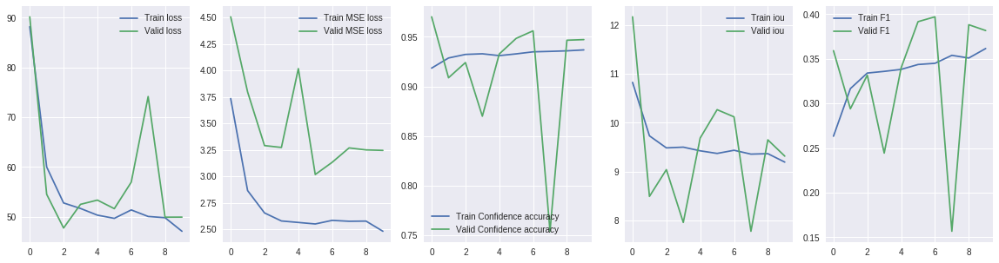

In [25]:
plt.figure(figsize=(20,5))
plt.subplot(151)
plt.plot(history.epoch, history.history["loss"], label="Train loss")
plt.plot(history.epoch, history.history["val_loss"], label="Valid loss")
plt.legend()
plt.subplot(152)
plt.plot(history.epoch, history.history["adj_mse"], label="Train MSE loss")
plt.plot(history.epoch, history.history["val_adj_mse"], label="Valid MSE loss")
plt.legend()
plt.subplot(153)
plt.plot(history.epoch, history.history["binary_accuracy"], label="Train Confidence accuracy")
plt.plot(history.epoch, history.history["val_binary_accuracy"], label="Valid Confidence accuracy")
plt.legend()
plt.subplot(154)
plt.plot(history.epoch, history.history["iou_loss_fn"], label="Train iou")
plt.plot(history.epoch, history.history["val_iou_loss_fn"], label="Valid iou")
plt.legend()
plt.subplot(155)
plt.plot(history.epoch, history.history["f1_score"], label="Train F1")
plt.plot(history.epoch, history.history["val_f1_score"], label="Valid F1")
plt.legend()

plt.show()

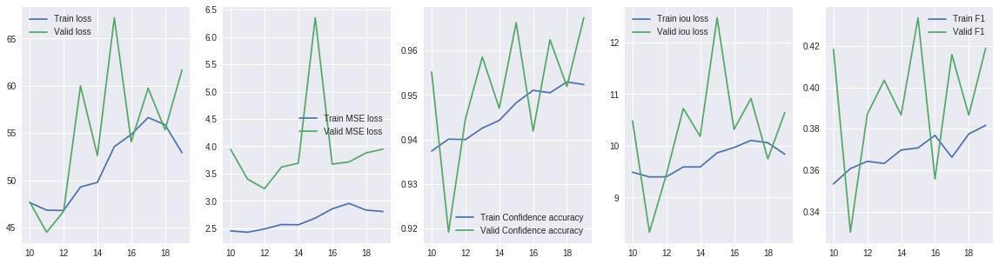

In [32]:
plt.figure(figsize=(20,5))
plt.subplot(151)
plt.plot(history.epoch, history.history["loss"], label="Train loss")
plt.plot(history.epoch, history.history["val_loss"], label="Valid loss")
plt.legend()
plt.subplot(152)
plt.plot(history.epoch, history.history["adj_mse"], label="Train MSE loss")
plt.plot(history.epoch, history.history["val_adj_mse"], label="Valid MSE loss")
plt.legend()
plt.subplot(153)
plt.plot(history.epoch, history.history["binary_accuracy"], label="Train Confidence accuracy")
plt.plot(history.epoch, history.history["val_binary_accuracy"], label="Valid Confidence accuracy")
plt.legend()
plt.subplot(154)
plt.plot(history.epoch, history.history["iou_loss_fn"], label="Train iou loss")
plt.plot(history.epoch, history.history["val_iou_loss_fn"], label="Valid iou loss")
plt.legend()
plt.subplot(155)
plt.plot(history.epoch, history.history["f1_score"], label="Train F1")
plt.plot(history.epoch, history.history["val_f1_score"], label="Valid F1")
plt.legend()

plt.show()

## Sample Predictions

In [0]:
model.load_weights(CHECKPOINT_PATH)

Pred: 1 1 conf: 0.7903818 171 102 195 331
Pred: 1 2 conf: 0.82511055 198 105 238 329
Pred: 1 4 conf: 0.79354566 524 102 239 318
Pred: 2 1 conf: 0.8502769 172 174 193 365
Pred: 2 2 conf: 0.9035501 204 145 235 377
Pred: 2 4 conf: 0.8424882 542 168 234 304
Pred: 3 1 conf: 0.78994906 160 301 197 296
Pred: 3 2 conf: 0.81041914 207 291 227 306
Pred: 3 4 conf: 0.7913685 555 311 222 279
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


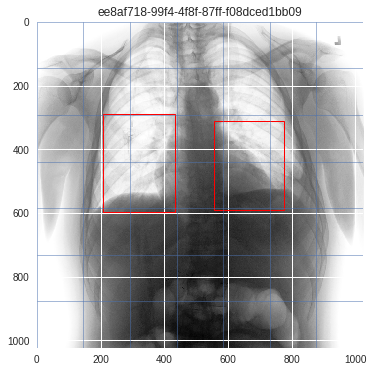

Pred: 2 4 conf: 0.62749046 582 226 216 293
Pred: 2 5 conf: 0.77852845 657 225 236 321
Pred: 3 5 conf: 0.7636128 665 323 231 290
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


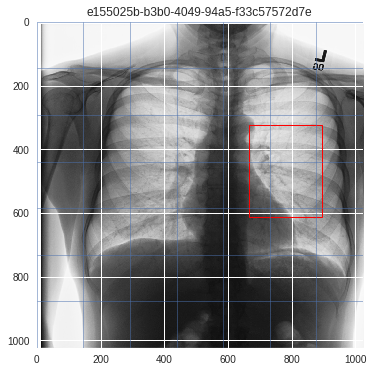

Pred: 1 4 conf: 0.769079 596 103 207 323
Pred: 1 5 conf: 0.80323595 643 107 239 322
Pred: 2 1 conf: 0.7210509 169 253 196 325
Pred: 2 2 conf: 0.8044296 199 256 238 322
Pred: 2 4 conf: 0.82013255 601 200 203 359
Pred: 2 5 conf: 0.8811852 645 191 239 370
Pred: 3 1 conf: 0.83138853 174 344 192 368
Pred: 3 2 conf: 0.8949234 201 345 238 373
Pred: 3 4 conf: 0.818356 601 298 197 315
Pred: 3 5 conf: 0.8694155 648 287 234 325
Pred: 4 1 conf: 0.78794926 164 446 194 303
Pred: 4 2 conf: 0.831169 210 438 229 305
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


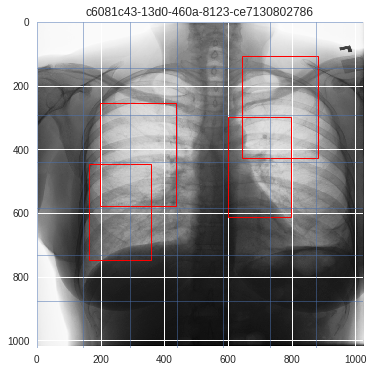

Pred: 1 4 conf: 0.80128694 567 122 224 303
Pred: 2 1 conf: 0.8022839 142 253 218 317
Pred: 2 2 conf: 0.7533535 195 249 227 329
Pred: 2 4 conf: 0.89331865 568 226 227 339
Pred: 2 5 conf: 0.81264514 628 233 218 358
Pred: 3 1 conf: 0.8852148 132 313 222 338
Pred: 3 2 conf: 0.8249646 195 291 224 372
Pred: 3 4 conf: 0.9054123 570 296 211 300
Pred: 3 5 conf: 0.840815 632 270 210 370
Pred: 4 1 conf: 0.789661 124 451 216 283
Pred: 4 4 conf: 0.70671177 570 450 208 279
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


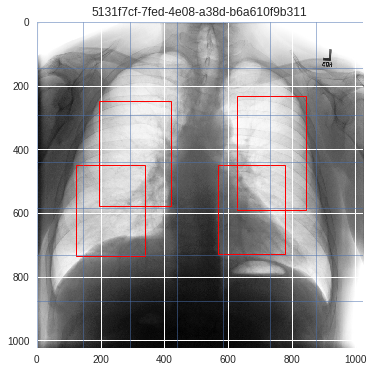

Pred: 1 1 conf: 0.79077816 139 122 219 304
Pred: 1 4 conf: 0.8209213 509 87 242 334
Pred: 2 1 conf: 0.9077691 127 224 228 341
Pred: 2 2 conf: 0.7878206 191 192 212 389
Pred: 2 3 conf: 0.7860488 467 177 191 363
Pred: 2 4 conf: 0.8738981 520 156 242 332
Pred: 3 1 conf: 0.90697074 127 296 216 308
Pred: 3 2 conf: 0.8020208 196 274 207 353
Pred: 3 3 conf: 0.6324866 465 298 189 310
Pred: 3 4 conf: 0.7884113 518 302 233 291
Pred: 4 1 conf: 0.829361 125 446 215 290
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


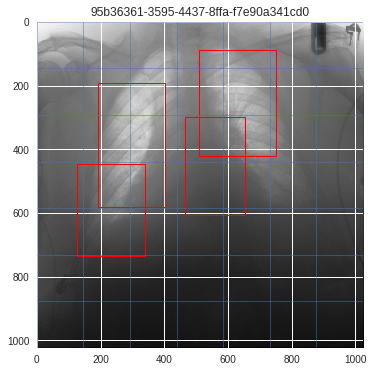

Pred: 1 4 conf: 0.7648266 582 113 216 311
Pred: 1 5 conf: 0.64210457 637 113 230 315
Pred: 2 1 conf: 0.77090263 169 244 197 332
Pred: 2 2 conf: 0.8227623 200 242 237 337
Pred: 2 4 conf: 0.8512402 587 220 214 344
Pred: 2 5 conf: 0.8308919 633 229 231 352
Pred: 3 1 conf: 0.8183941 174 324 191 365
Pred: 3 2 conf: 0.8871846 203 294 234 377
Pred: 3 4 conf: 0.86524534 584 299 208 310
Pred: 3 5 conf: 0.85546434 636 281 226 358
Pred: 4 1 conf: 0.79178333 166 446 194 308
Pred: 4 2 conf: 0.8491524 209 435 231 314
Pred: 4 4 conf: 0.7230093 582 456 208 277
Pred: 4 5 conf: 0.7577065 645 442 227 313
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


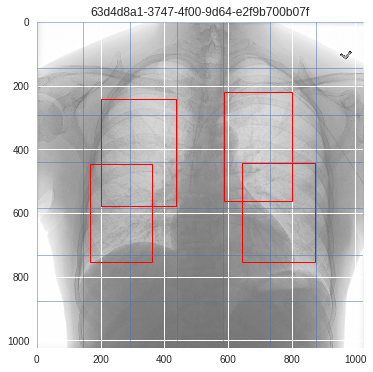

Pred: 1 4 conf: 0.77989686 554 124 228 300
Pred: 2 1 conf: 0.854755 181 253 191 338
Pred: 2 2 conf: 0.89533514 186 240 228 365
Pred: 2 4 conf: 0.8762459 558 238 232 328
Pred: 2 5 conf: 0.7929026 628 239 218 349
Pred: 3 1 conf: 0.9183398 181 288 184 372
Pred: 3 2 conf: 0.9488606 190 249 216 409
Pred: 3 4 conf: 0.9108422 560 297 220 309
Pred: 3 5 conf: 0.8232552 633 274 209 381
Pred: 4 1 conf: 0.85421115 176 439 182 301
Pred: 4 2 conf: 0.8799293 197 428 211 316
Pred: 4 4 conf: 0.82043594 566 448 210 283
Pred: 4 5 conf: 0.6711603 636 433 214 331
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


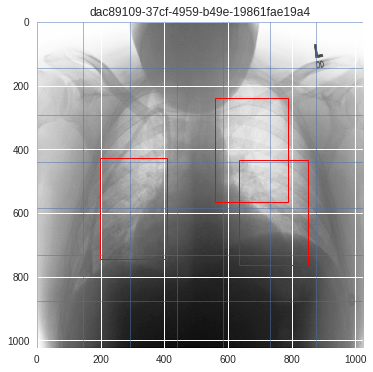

Pred: 2 1 conf: 0.7885276 173 253 193 328
Pred: 2 2 conf: 0.8203684 193 245 232 339
Pred: 2 4 conf: 0.80553603 584 232 217 331
Pred: 2 5 conf: 0.79955095 641 236 234 336
Pred: 3 1 conf: 0.8513663 179 346 189 372
Pred: 3 2 conf: 0.89171755 191 297 229 408
Pred: 3 4 conf: 0.8200022 585 318 213 306
Pred: 3 5 conf: 0.81911635 645 301 231 350
Pred: 4 1 conf: 0.8405213 176 437 185 322
Pred: 4 2 conf: 0.88940233 200 422 224 336
Pred: 4 4 conf: 0.7564452 581 464 213 274
Pred: 4 5 conf: 0.75971615 649 453 230 307
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


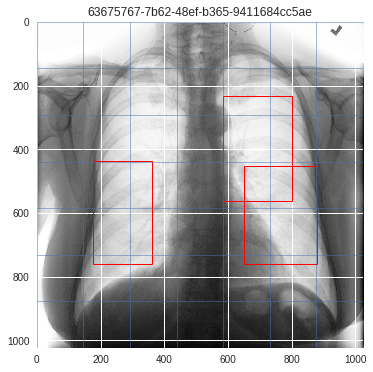

Truth: 2 1 177 344 210 168
Truth: 2 2 177 344 236 168
Truth: 2 4 634 191 157 299
Truth: 3 1 172 345 236 474
Truth: 3 2 177 345 236 474
Truth: 4 1 172 350 236 474
Truth: 4 2 177 350 236 474
Truth: 5 4 617 691 168 180
Pred: 1 2 conf: 0.7795606 200 129 240 301
Pred: 1 4 conf: 0.81050706 585 135 217 295
Pred: 1 5 conf: 0.6422986 630 123 217 317
Pred: 2 1 conf: 0.7820624 198 257 175 345
Pred: 2 2 conf: 0.9309133 182 254 257 341
Pred: 2 4 conf: 0.94147485 589 239 213 343
Pred: 2 5 conf: 0.88005805 631 237 205 381
Pred: 3 1 conf: 0.8747969 200 343 172 404
Pred: 3 2 conf: 0.9745385 192 269 233 420
Pred: 3 4 conf: 0.96888494 585 286 199 320
Pred: 3 5 conf: 0.9296931 640 239 185 445
Pred: 4 1 conf: 0.8687994 196 421 170 349
Pred: 4 2 conf: 0.9516541 196 420 213 330
Pred: 4 4 conf: 0.9080481 591 451 187 268
Pred: 4 5 conf: 0.8721123 637 408 195 363
Pred: 5 1 conf: 0.77504575 175 588 183 296
Pred: 5 2 conf: 0.7903838 200 582 214 302
False Negative: 5 4 conf: 0.46511403
IOU post-nms: 0.541563930376

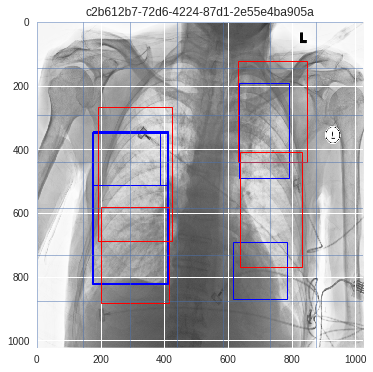

Pred: 1 4 conf: 0.78714776 583 119 216 306
Pred: 2 1 conf: 0.75775427 173 262 193 319
Pred: 2 2 conf: 0.79777634 192 257 229 326
Pred: 2 4 conf: 0.8987994 592 224 211 347
Pred: 2 5 conf: 0.83585864 628 237 225 354
Pred: 3 1 conf: 0.86390364 177 376 192 355
Pred: 3 2 conf: 0.88169587 187 355 228 384
Pred: 3 4 conf: 0.91396236 592 293 201 322
Pred: 3 5 conf: 0.87690294 632 271 217 382
Pred: 4 1 conf: 0.8855433 175 434 185 321
Pred: 4 2 conf: 0.90055496 196 418 218 342
Pred: 4 4 conf: 0.8135335 589 446 198 286
Pred: 4 5 conf: 0.80005056 637 432 218 323
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


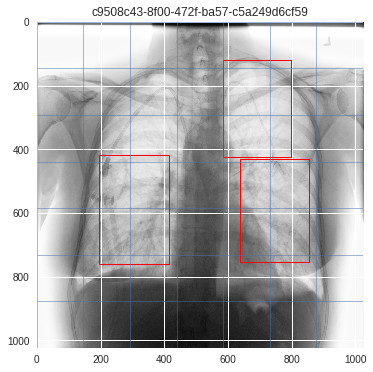

Truth: 3 1 216 508 135 130
Pred: 1 1 conf: 0.64034265 176 119 191 316
Pred: 1 2 conf: 0.8186682 191 113 234 327
Pred: 1 4 conf: 0.82807505 604 109 200 324
Pred: 1 5 conf: 0.8209737 629 109 231 332
Pred: 2 1 conf: 0.85429394 182 238 189 353
Pred: 2 2 conf: 0.91970485 187 217 229 385
Pred: 2 4 conf: 0.8897737 610 190 194 374
Pred: 2 5 conf: 0.9129176 626 199 230 395
Pred: 3 1 conf: 0.8791098 183 284 180 331
Pred: 3 2 conf: 0.9355333 196 269 217 345
Pred: 3 4 conf: 0.88742346 608 292 187 305
Pred: 3 5 conf: 0.93162316 635 264 221 363
Pred: 4 1 conf: 0.6922978 167 446 188 289
Pred: 4 2 conf: 0.7225759 201 436 214 302
IOU post-nms: 0.07958714452173074
IOU: 0.07958714452173074
Map IOU: 0.0


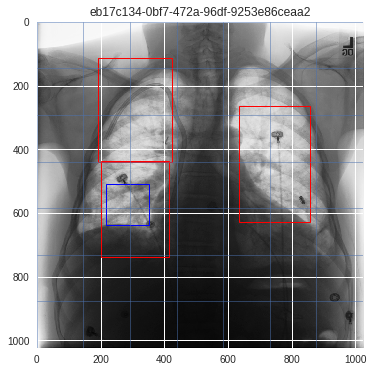

Pred: 1 1 conf: 0.64300364 157 116 207 311
Pred: 1 4 conf: 0.8087009 527 115 239 309
Pred: 2 1 conf: 0.86513996 164 242 201 336
Pred: 2 2 conf: 0.84510833 189 234 227 358
Pred: 2 4 conf: 0.8915987 538 194 242 350
Pred: 2 5 conf: 0.6912467 631 215 210 370
Pred: 3 1 conf: 0.89272505 161 292 194 316
Pred: 3 2 conf: 0.8835873 197 274 220 342
Pred: 3 4 conf: 0.89349234 553 297 221 298
Pred: 3 5 conf: 0.77315915 633 279 206 371
Pred: 4 4 conf: 0.63833684 553 450 217 281
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


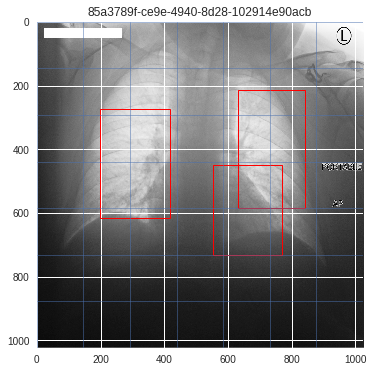

Pred: 1 4 conf: 0.7802147 598 120 204 310
Pred: 1 5 conf: 0.7102079 631 119 227 315
Pred: 2 1 conf: 0.6035863 176 258 190 323
Pred: 2 2 conf: 0.8062041 199 260 238 319
Pred: 2 4 conf: 0.9040576 608 225 198 355
Pred: 2 5 conf: 0.8755874 626 234 227 366
Pred: 3 1 conf: 0.8169239 183 367 186 362
Pred: 3 2 conf: 0.88857865 193 372 237 360
Pred: 3 4 conf: 0.9205518 609 287 189 336
Pred: 3 5 conf: 0.91554004 630 262 218 395
Pred: 4 1 conf: 0.8148966 181 438 183 336
Pred: 4 2 conf: 0.887236 204 426 229 335
Pred: 4 4 conf: 0.82158244 600 446 189 285
Pred: 4 5 conf: 0.8194337 637 428 215 324
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


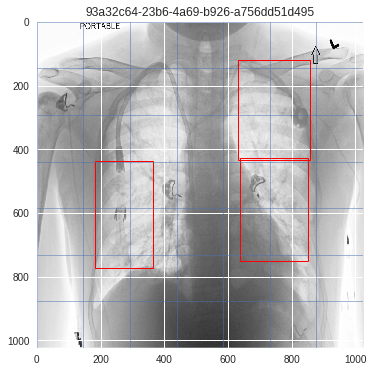

Truth: 4 5 655 515 170 191
Pred: 1 2 conf: 0.8240967 223 129 248 298
Pred: 1 4 conf: 0.78430074 605 125 199 308
Pred: 1 5 conf: 0.7789327 632 116 229 318
Pred: 2 1 conf: 0.64154935 195 241 176 354
Pred: 2 2 conf: 0.93759584 226 244 260 332
Pred: 2 4 conf: 0.90126145 608 229 198 352
Pred: 2 5 conf: 0.87906647 626 229 229 369
Pred: 3 1 conf: 0.7084451 196 297 172 377
Pred: 3 2 conf: 0.95375955 220 289 232 307
Pred: 3 4 conf: 0.930724 606 286 189 324
Pred: 3 5 conf: 0.91963196 630 261 218 393
Pred: 4 2 conf: 0.78171724 216 449 224 275
Pred: 4 4 conf: 0.84176475 602 446 186 282
Pred: 4 5 conf: 0.8312333 637 428 215 320
IOU post-nms: 0.11771487405517149
IOU: 0.11771487405517149
Map IOU: 0.0625


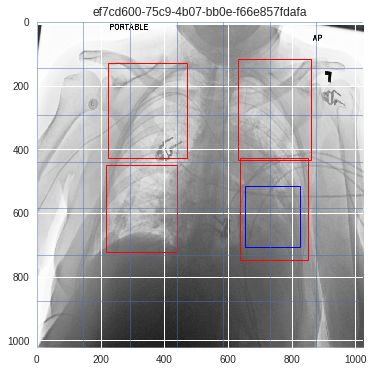

Truth: 2 5 652 355 245 146
Truth: 3 4 651 356 140 253
Truth: 3 5 652 356 245 253
Pred: 1 2 conf: 0.7898729 205 107 238 320
Pred: 2 1 conf: 0.8043845 169 218 197 352
Pred: 2 2 conf: 0.8630827 204 200 238 367
False Negative: 2 5 conf: 0.093292125
Pred: 3 1 conf: 0.7990002 163 304 198 316
Pred: 3 2 conf: 0.8469293 210 288 233 325
False Negative: 3 4 conf: 0.26195163
False Negative: 3 5 conf: 0.093292125
Pred: 4 2 conf: 0.6402777 210 450 230 298
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0.0


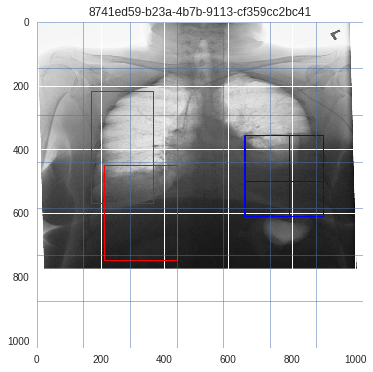

Truth: 3 2 271 423 230 247
Truth: 4 2 271 520 230 150
Pred: 1 2 conf: 0.7860179 272 129 224 296
Pred: 1 4 conf: 0.81284016 621 123 190 321
Pred: 1 5 conf: 0.87297803 617 125 244 325
Pred: 2 2 conf: 0.928883 264 242 235 332
Pred: 2 3 conf: 0.733606 340 246 202 352
Pred: 2 4 conf: 0.92104715 628 207 185 387
Pred: 2 5 conf: 0.9766938 621 183 238 425
Pred: 3 2 conf: 0.95387757 252 291 226 320
Pred: 3 3 conf: 0.81006587 344 267 194 357
Pred: 3 4 conf: 0.91760397 626 283 175 319
Pred: 3 5 conf: 0.9851576 634 259 222 364
Pred: 4 2 conf: 0.8605538 259 448 213 278
Pred: 4 4 conf: 0.8019917 628 440 171 292
Pred: 4 5 conf: 0.9248261 647 447 220 277
IOU post-nms: 0.22391364049169185
IOU: 0.22391364049169185
Map IOU: 0.125


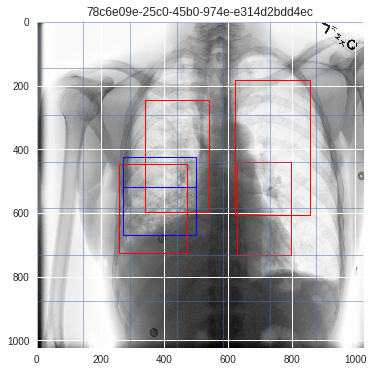

Pred: 1 4 conf: 0.7028388 499 105 235 319
Pred: 2 1 conf: 0.80636317 130 242 225 322
Pred: 2 2 conf: 0.60629153 197 247 226 327
Pred: 2 3 conf: 0.8034011 448 234 208 335
Pred: 2 4 conf: 0.8250789 496 234 238 341
Pred: 3 1 conf: 0.84437084 128 316 223 302
Pred: 3 2 conf: 0.78326726 199 296 223 347
Pred: 3 3 conf: 0.82367295 449 308 204 317
Pred: 3 4 conf: 0.8505668 498 292 232 351
Pred: 4 1 conf: 0.75650066 121 459 220 275
Pred: 4 3 conf: 0.6578813 442 459 206 277
Pred: 4 4 conf: 0.78008324 501 444 230 311
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


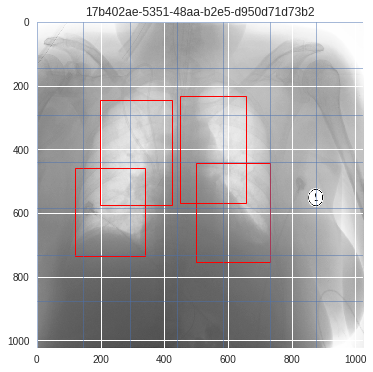

Pred: 1 1 conf: 0.7698284 162 115 202 315
Pred: 1 2 conf: 0.7814481 193 113 229 321
Pred: 1 4 conf: 0.76105714 535 104 234 315
Pred: 2 1 conf: 0.8728553 160 229 205 345
Pred: 2 2 conf: 0.84590983 190 195 223 389
Pred: 2 4 conf: 0.8201422 537 189 236 324
Pred: 3 1 conf: 0.88572395 156 296 199 309
Pred: 3 2 conf: 0.87231797 197 273 219 349
Pred: 3 4 conf: 0.8013662 543 312 228 280
Pred: 4 1 conf: 0.77559936 144 449 205 284
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


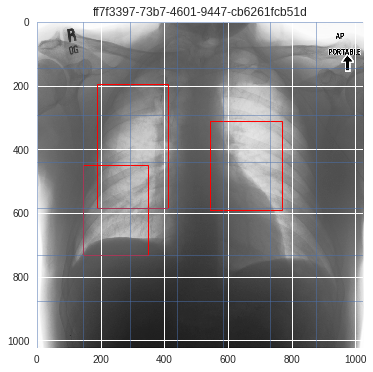

Pred: 1 4 conf: 0.85690063 499 111 245 321
Pred: 2 2 conf: 0.7857461 203 229 232 338
Pred: 2 3 conf: 0.61330813 482 213 180 368
Pred: 2 4 conf: 0.9467257 518 155 244 361
Pred: 3 1 conf: 0.8112208 145 380 217 330
Pred: 3 2 conf: 0.81624645 197 317 228 372
Pred: 3 4 conf: 0.9313639 515 292 232 301
Pred: 4 1 conf: 0.8239683 137 460 216 291
Pred: 4 2 conf: 0.81041306 202 438 227 337
Pred: 4 4 conf: 0.8376393 531 447 223 280
IOU post-nms: 0.0
IOU: 0.0
Map IOU: 0


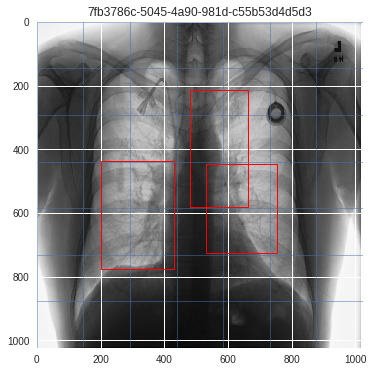

Truth: 2 5 645 356 219 144
Truth: 3 2 308 382 161 295
Truth: 3 4 645 357 152 310
Truth: 3 5 645 357 219 310
Truth: 4 2 308 513 161 164
Truth: 4 5 645 523 219 144
Pred: 1 1 conf: 0.603489 172 110 194 323
Pred: 1 2 conf: 0.81238425 201 113 239 319
Pred: 1 4 conf: 0.82148355 599 106 204 324
Pred: 1 5 conf: 0.81485456 632 105 232 333
Pred: 2 1 conf: 0.80595946 180 217 188 361
Pred: 2 2 conf: 0.89737976 198 208 238 369
Pred: 2 4 conf: 0.88548404 606 181 197 370
Pred: 2 5 conf: 0.8945174 630 164 230 402
Pred: 3 1 conf: 0.8054732 176 296 186 333
Pred: 3 2 conf: 0.8856102 205 282 230 327
Pred: 3 4 conf: 0.8555191 603 295 190 301
Pred: 3 5 conf: 0.87196666 636 276 222 343
False Negative: 4 2 conf: 0.17679405
False Negative: 4 5 conf: 0.52526003
IOU post-nms: 0.31202933860227605
IOU: 0.31202933860227605
Map IOU: 0.078125


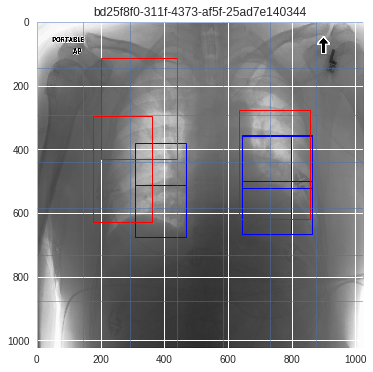

Overall Mean IOU: 0.06374044640238992
Overall Map IOU: 0.01843276515151515


In [33]:
THRESHOLD = 0.6
OVERLAP = 0.3
# look at some sample predictions
samples = np.random.choice(valid_filenames, size=20, replace=False)
# samples = problem_names

coords = np.arange(0, 1024, CELL_SIZE)
overall_ious = []
map_ious = []

for filename in samples:
    # load the image
    img = pydicom.dcmread(os.path.join(train_dicom_dir, filename)).pixel_array
    
    filename = filename.split('.')[0]
    
    f, ax = plt.subplots(figsize=(6, 6))
    plt.imshow(img)
    
    # initialize our lists
    ious = []
    truths = []
    boxes = []
    
    # draw the truth boxes
    if filename in pneumonia_locations:
        locs = pneumonia_locations[filename].copy()
        for i in range(GRID_SIZE):
            for j in range(GRID_SIZE):
                pixel_data = locs[i,j,:]
                if pixel_data[0] > 0.5:
                    x, y, w, h = pixel_data[1:]
                    
                    # unnormalize the data
                    w = w * 1024
                    h = h * 1024
                    
                    x = unnorm(x, j, CELL_SIZE)
                    y = unnorm(y, i, CELL_SIZE)
                    
                    # get the corners
                    x = x - (w // 2)
                    y = y - (h // 2)
                    
                    x = int(x)
                    y = int(y)
                    w = int(w)
                    h = int(h)
                    locs[i,j,:] = [1, x, y, w, h]
                    print("Truth:", i, j, x, y, w, h)
                    truths.append([x, y, w, h])
                    
                    rect = patches.Rectangle((x,y),w,h,linewidth=1,edgecolor='b',facecolor='none')
                    ax.add_patch(rect)
                    
    # predict the image
    img = resize(img, (IMAGE_SIZE, IMAGE_SIZE), mode='reflect')
    yhat = model.predict(img.reshape(1, IMAGE_SIZE, IMAGE_SIZE, 1))
    conf = np.squeeze(yhat)[:,:,0]
    bboxes = np.squeeze(yhat)[:,:,1:]    
    pred_boxes = np.zeros_like(bboxes)
  
    # print the confidences for our true boxes, if any
    mask = (locs[...,0] > 0.5)
    
    # loop through our predictions
    for i in range(GRID_SIZE):
        for j in range(GRID_SIZE):
            conf_ = conf[i,j]
            # if we have a prediction
            if conf_ > THRESHOLD:
                x,y,w,h = bboxes[i,j,:]
                
                # unnormalize the data
                w = w * 1024
                h = h * 1024

                x = unnorm(x, j, CELL_SIZE)
                y = unnorm(y, i, CELL_SIZE)
                
                # convert to upper left corner from center
                x = np.maximum(x - (w // 2), 0)
                y = np.maximum(y - (h // 2), 0)
                
                x = int(x)
                y = int(y)
                w = int(w)
                h = int(h)
                
                pred_boxes[i,j,:] = [x, y, w, h]
                
                print("Pred:", i, j, "conf:", conf_, x, y, w, h)
                
                # if the boxes have width and height add them to our list
                if w > 30 and h > 30:
                    boxes.append([x,y,w,h, conf_])
            elif mask[i,j]:
              print("False Negative:", i, j, "conf:", conf_)
              
    ## if we have ground truths OR predictions calculate the IOUs:
    if len(boxes) or len(truths):
        # do non-max suppression of our boxes
        nms_boxes = non_max_suppression_fast(np.array(boxes), OVERLAP)

        # only count the IOU if there are either ground truths or predictions
        if len(nms_boxes) or len(truths):
            iou = calc_iou_better(np.array(truths), np.array(nms_boxes))
            print("IOU post-nms:", iou)
            overall_ious.append(iou)

        # plot our boxes
        for box in nms_boxes:
            x,y,w,h,c = box
            rect = patches.Rectangle((x,y), w, h, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

        if len(nms_boxes):
            scores = nms_boxes[...,4]
        else:
            scores = np.array([])

        map_iou_score = map_iou(np.array(truths), np.array(nms_boxes), scores)

        if map_iou_score is not None:
            map_ious.append(map_iou_score)

        for item in coords:
            plt.axvline(item, linewidth=0.5)
            plt.axhline(item, linewidth=0.5)

        print("IOU:", iou)
        print("Map IOU:", map_iou_score)
    
    plt.title(filename)
    plt.show()
    
print("Overall Mean IOU:", np.mean(overall_ious))    
print("Overall Map IOU:", np.mean(map_ious))    

## Threshold Curves

In [0]:
def scores_at_threshold(y_true, y_pred, thresholds=[0.5, 0.55, 0.6,0.65, 0.7,0.75, 0.8, 0.85, 0.9]):
    prec_scores = []
    rec_scores = []
    iou_scores = []
    accuracy_scores = []
    
    # calculate the scores
    for threshold in thresholds:
        # extract the prediction from the input
        pred_true = (y_pred[...,0] > threshold) * 1.0
        gt_true = np.round(y_true[...,0])

        # calculate the prec, rec, accuracy
        accuracy = np.mean((pred_true == gt_true) * 1.0)
        
        tp = np.sum(pred_true * gt_true)
        fp = np.sum(pred_true * (gt_true == 0))
        fn = np.sum(gt_true * (pred_true == 0))
        
        # if there are true ROIs and predictions
        if (np.sum(gt_true) > 0) and (np.sum(pred_true) > 0):
            precision = tp / (tp + fp)
            recall = tp / (tp + fn)
        # else if there are no truths but there are preds it is 0
        elif (np.sum(gt_true) == 0) and (np.sum(pred_true) > 0):
            precision = 0
            recall = 0
        # else if both are 0 we predicted all correctly
        else:
            precision = 1
            recall = 1
        
        accuracy_scores.append(accuracy)
        prec_scores.append(precision)
        rec_scores.append(recall)
        
        temp_ious = []
        # calculate the IOU
        for gt_, yhat_ in zip(y_true, y_pred):
            # if there are true ROIs calculate the ROI
            gt_rois = unnorm_label(np.squeeze(gt_), threshold)
            pred_rois = unnorm_label(np.squeeze(yhat_), threshold)

            iou = calc_iou_better(gt_rois, pred_rois)
            temp_ious.append(iou)

        iou_scores.append(np.mean(temp_ious))
        
    return prec_scores, rec_scores, iou_scores, accuracy_scores, thresholds

def plot_thresholds(thresholds=[0.5, 0.55, 0.6,0.65, 0.7,0.75, 0.8, 0.85, 0.9], iterations=30):
    precs = np.zeros_like(thresholds)
    recs = np.zeros_like(thresholds)
    ious = np.zeros_like(thresholds)
    accs = np.zeros_like(thresholds)

    counter = 0
    for imgs, labels in valid_gen:
        preds = model.predict(imgs)
        prec, rec, iou, acc, th = scores_at_threshold(labels, preds, thresholds)
        precs += np.array(prec)
        recs += np.array(rec)
        ious += np.array(iou)
        accs += np.array(acc)

        counter += 1
        if counter > iterations:
            precs /= counter
            recs /= counter
            ious /= counter
            accs /= counter
            break
            
    plt.plot(thresholds, ious, color="red", label="IOU")
    plt.legend()
    plt.show()
    
    plt.plot(thresholds, recs, color="red", label="Recall")
    plt.plot(thresholds, precs, color="green", label="Precision")
    plt.plot(thresholds, accs, color="blue", label="Accuracy")
    plt.legend()
    plt.show()

In [0]:
plot_thresholds([0.5, 0.55, 0.6,0.65, 0.7,0.75, 0.8, 0.85, 0.9], iterations=40)

# Predict test images

In [0]:
THRESHOLD = 0.6

# load and shuffle filenames
folder = './stage_1_test_images'
test_filenames = os.listdir(folder)
print('n test samples:', len(test_filenames))

# create test generator with predict flag set to True
test_gen = generator(folder, test_filenames, None, batch_size=24, image_size=IMAGE_SIZE, shuffle=False, predict=True)

# create submission dictionary
submission_dict = {}
# loop through testset
for imgs, filenames in test_gen:
    
    # predict batch of images
    yhats = model.predict(imgs)
    
    # loop through batch
    for yhat, filename in zip(yhats, filenames):
        predictionString = ""
        boxes = []
        for i in range(GRID_SIZE):
            for j in range(GRID_SIZE):
                conf = yhat[i, j, 0]
                if conf > THRESHOLD:
                    x, y, w, h = yhat[i,j, 1:]
                    
                    # possible thresholds to keep our boxes within reasonable sizes?
                    if True: #w < 600 and h < 1000:
                        w = w * 1024
                        h = h * 1024

                        x = unnorm(x, j, CELL_SIZE)
                        y = unnorm(y, i, CELL_SIZE)

                        # convert to upper left corner from center
                        x = x - (w // 2)
                        y = y - (h // 2)
                        
                        if w > 20 and h > 20:
                            # make sure our boxes don't run off the edges of the images
                            w = np.minimum(w, 1024 - x)
                            h = np.minimum(h, 1024 - y)
                            boxes.append([x,y,w,h])

        # do our non-max suppression here
        boxes = non_max_suppression_fast(np.array(boxes), 0.3)
        
        # loop through our suppressed boxes and creat the prediction string
        for box in boxes:
            x,y,w,h = box
            
            x = int(x)
            y = int(y)
            w = int(w)
            h = int(h)
        
            # create the prediction string
            predictionString += str(0.9) + ' ' + str(x) + ' ' + str(y) + ' ' + str(w) + ' ' + str(h) + ' '
            
        # add filename and predictionString to dictionary
        filename = filename.split('.')[0]
        submission_dict[filename] = predictionString

    # stop if we've got them all
    if len(submission_dict) >= len(test_filenames):
        break
    
# save dictionary as csv file
sub = pd.DataFrame.from_dict(submission_dict,orient='index')
sub.index.names = ['patientId']
sub.columns = ['PredictionString']

now = datetime.datetime.now()
today = str(now)[:10]
submission_file = today + "_yolo_submission.csv" 
sub.to_csv(submission_file)

In [0]:
!kaggle competitions submit -c rsna-pneumonia-detection-challenge -f {submission_file} -m "YOLOv23.1 480x480 20 epochs"

In [0]:
# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'pneumonia'

!gcloud config set project {project_id}
!gsutil cp ./{CHECKPOINT_PATH} gs://{bucket_name}/